

# Выпускная квалификационная работа Филимонова Фёдора Игоревича


Слушателя курса "Data Science PRO 2.0"  центра дополнительного образования МГТУ им. Н.Э. Баумана

Тема:
Прогнозирование конечных свойств новых материалов (композиционных материалов). 

Цель исследования: Создать алгоритм машинного обучения, который будет определять значения:

    * Модуль упругости при растяжении, ГПа;
    * Прочность при растяжении, МПа;
    * Соотношение матрица-наполнитель.

Требуется:
1) Провести разведочный анализ предложенных данных. Необходимо нарисовать гистограммы распределения каждой из переменных, диаграммы коробки с нами, попарные графики рассеяния точек. Необходимо также для колонке получить среднее, срединное значение, провести анализ и привести каждую колонку, проверить наличие пропусков.
2) Провести предобработку данных (удаление шумов, нормализации и т.д.). 
3) Обучить несколько моделей для расчета модуля упругости и прочности поставки. При построении модели необходимо 30% данных оставить на модели тестирования, на остальных происходит обучение моделей. При построении модели проводят поиск гиперпараметров модели с помощью определения по сетке с перекрестной проверкой, количество блоков равно 10. 
4) Написать нейронную сеть, которая будет исключать соединение матрица-наполнитель. 
5) Разработать приложение с графическим интерфейсом или интерфейсом командной строки, которая будет выдавать прогноз, полученный в задании 3 или 4 (один или два прогноза, на выбор учащегося).

Подготовка к работе.

Для работы использовалась редактор кода для разных языков программирования от компании Microsoft - Visual Studio Code (VS Code)

Вся работа будет проводится в Файле IPYND являеющимся документом IPython Notebook.

Используемые версии: pip 24.3.1, python 3.12

# Приступаем к выполнению задания

# Шаг первый - подготовка данных

*Задача: Провести разведочный анализ предложенных данных. Необходимо нарисовать гистограммы распределения каждой из переменной, диаграммы ящика с усами, попарные графики рассеяния точек. Необходимо также для каждой колонке получить среднее, медианное значение, провести анализ и исключение выбросов, проверить наличие пропусков. Провести предобработку данных (удаление шумов, нормализация и т.д.).*

Список используемых библиотек.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer, MaxAbsScaler, RobustScaler
from scipy import stats
import os

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.svm import SVR 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import mnist


from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping

import tkinter as tk
from tkinter import messagebox


Загрузка данных из исходных excel таблиц (X_bp и X_nup)

In [2]:
DS1=pd.read_excel('X_bp.xlsx')
DS2=pd.read_excel('X_nup.xlsx')

Ознакомление с загруженными данными.

Выводим количество строк и столбцов по двум таблицам

In [3]:
DS1.shape

(1023, 11)

In [4]:
DS2.shape

(1040, 4)

Выводим информацию по названию столбцов

In [5]:
DS1.columns

Index(['Unnamed: 0', 'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2'],
      dtype='object')

In [6]:
DS2.columns

Index(['Unnamed: 0', 'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'], dtype='object')

Выводим часть таблицы по обоим файлам для ознакомления с информацией содержащихся в них

In [7]:
DS1.head(4) # вывод первых 4 строк

,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,3,1.857143,2030.0,738.736842,129.0,21.250000,300.000000,210.0,70.0,3000.0,220.0


In [8]:
DS2.sample(4) # Вывод произвольных 4 строк

,Unnamed: 0,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
466,466,0,5.988357,24.860511
910,910,90,6.392640,53.489159
276,276,0,10.299656,78.443495
777,777,90,8.550560,59.167552


*Из представленной выше информации делаю вывод, что информация по столбцу "Unnamed: 0" не будет для нас информативной и предлагаю удлить её из обоих таблиц*

In [9]:
DS1.drop(['Unnamed: 0'],axis=1, inplace=True)

DS1.tail(3) # вывож 3 последних строк

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067
1022,3.808020,1890.413468,417.316232,129.183416,27.474763,300.952708,758.747882,74.309704,2856.328932,194.754342


In [10]:
DS2.drop(['Unnamed: 0'],axis=1, inplace=True)

DS2.tail(3) # вывож 3 последних строк

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479
1039,90,9.021043,66.920143


Производим объеденение двух таблиц  по индексу, тип объединения — INNER. После объеденения проверим размерность, выведим несколько строк таблицы и название стобцов для озакомления.

In [11]:
DS3=pd.merge(DS1,DS2,left_index = True, right_index = True, how = 'inner')

In [12]:
DS3.shape # кол-во строк и столюцов после объединения

(1023, 13)

In [13]:
DS3.columns # название колонок

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [14]:
DS3.head(4) # Выводим часть объеденённой таблицы (первые 4 строк) для ознакомления

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.9,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.0,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0


Просмотрим информацию о таблице DS3, проверим тип данных в каждом столбце.

In [15]:
DS3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

*Из информации выше мы видим, что нет пропусков, NaN так же отсутствует.*

*Проверим отсутствующие значения и процент пропуска другим способом представленным ниже.*

In [16]:
DS3.isnull().sum() # Проверка наличия пропущенных результатов и их суммирование при наличии

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [17]:
total_fields=DS3.size
missing_values_count = DS3.isnull().sum().sum()

# Процент пропущенных значений
missing_values_percentage = (missing_values_count / total_fields) * 100

print(f"Процент отсутствующих значений: {missing_values_percentage:.2f}%")

Процент отсутствующих значений: 0.00%


In [18]:
DS3.duplicated().sum() # Проверка на наличие дубликатов

np.int64(0)

In [19]:
DS3.nunique() # поиск уникальных значений

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

*Всего в данной таблице 1023 строки, как мы видеи из информации представленной выше, практически, каждый столбец имеет ярко выражженую индивидуальность, кром одного. Столбец " Угол нашивки, град" имеет всего 2 (два) значения.*

In [20]:
DS3['Угол нашивки, град'].unique() # Посмотрим какие значения содержатся в данном столбце

array([ 0, 90])

Ознакомимся с описательной статистикой наших данных.

| наименование столбца | Значение |
|----------------------|----------|
| ount | количество значений |
| mean | среднее значение |
| std | стандартное отклонение |
| min | минимум |
| 25% | верхнее значение первого квартиля|
| 50% | медиана |
| 75% | верхнее значение третьего квартиля |
| max | максимум |

In [21]:
description = DS3.describe() # Получение описательной статистики

description.T # Поворот таблицы

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


# Согласно заданию нужно получить среднее, медианное значение для каждой колонки отдельно.

In [22]:
срзнач_медиана = DS3.describe()
срзнач_медиана.loc[['mean', '50%']]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920


In [23]:
DS3.mean() # среднее значение в отдельной колонке

Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки, град                        44.252199
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
dtype: float64

In [24]:
DS3.median()# медиана в отдельной колонке

Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температура вспышки, С_2                 285.896812
Поверхностная плотность, г/м2            451.864365
Модуль упругости при растяжении, ГПа      73.268805
Прочность при растяжении, МПа           2459.524526
Потребление смолы, г/м2                  219.198882
Угол нашивки, град                         0.000000
Шаг нашивки                                6.916144
Плотность нашивки                         57.341920
dtype: float64

Визуализация корреляционной матрицы с помощью тепловых карт используя методы "Пирсона", "Кендалл", "Спирмена" поочерёдно.

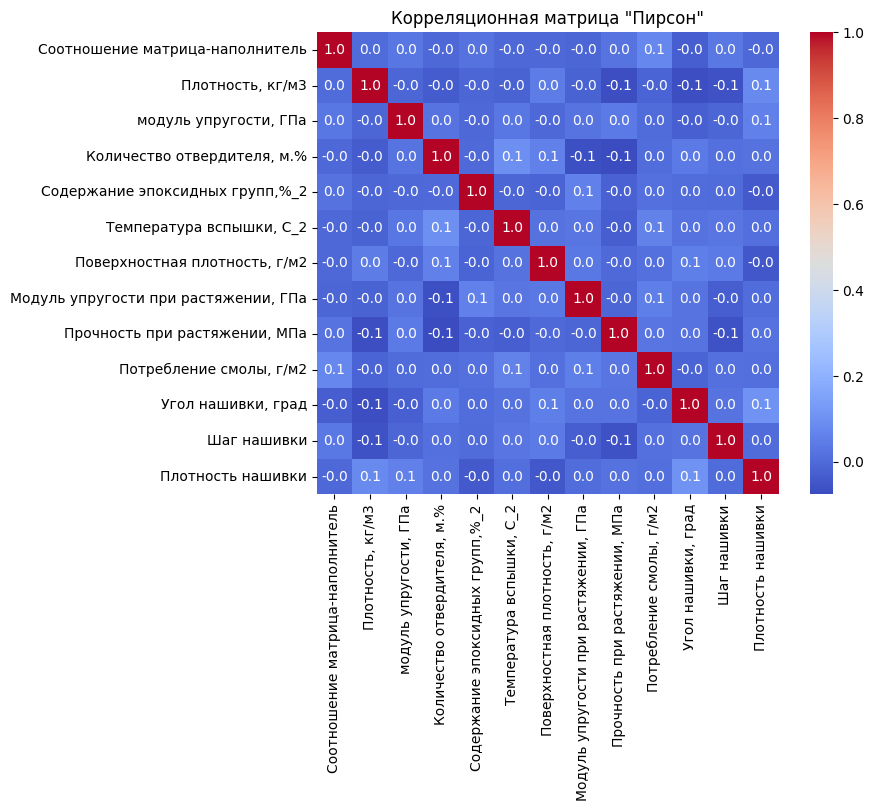

In [25]:
correlation_matrix = DS3.corr(method="pearson")

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt='.1f', cmap='coolwarm', square=True)
plt.title('Корреляционная матрица "Пирсон"')
plt.show()

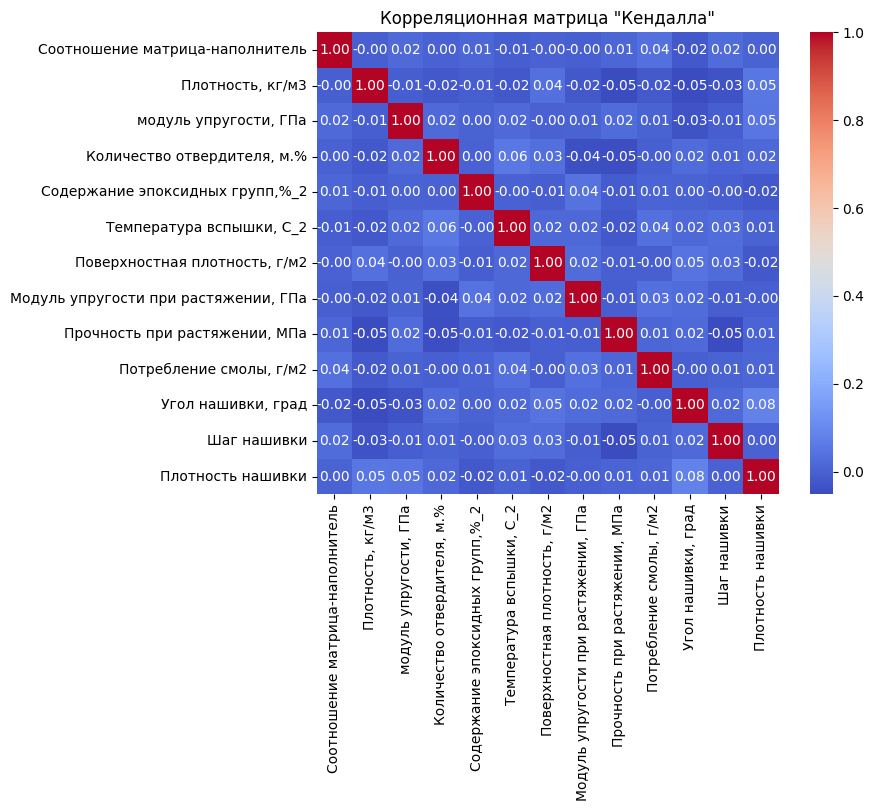

In [26]:
correlation_matrix = DS3.corr(method="kendall")

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
plt.title('Корреляционная матрица "Кендалла"')
plt.show()

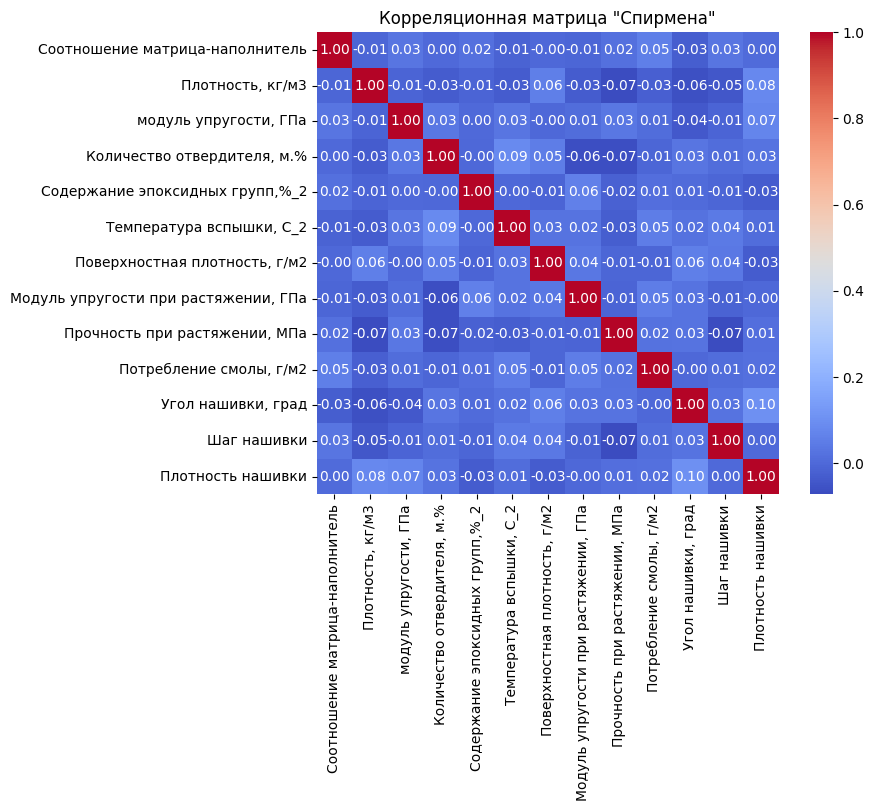

In [27]:
correlation_matrix = DS3.corr(method="spearman")

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
plt.title('Корреляционная матрица "Спирмена"')
plt.show()

# Визуализируем данные и проведем анализ

Для удобства работы в дальнейшем при визуализации создадим палитру (цветовую плашку), а так же одну единую переменную для обозначения всех колонок в DS3.

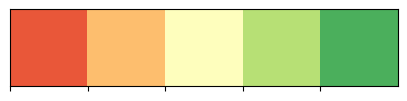

In [28]:
Plashka = sns.color_palette("RdYlGn", n_colors=5) # Плашка на 5 цветов

sns.palplot(Plashka)
plt.show()

In [29]:
names_columns=DS3.columns # переменная для колонок

Гистограмма распределения (первый вариант)

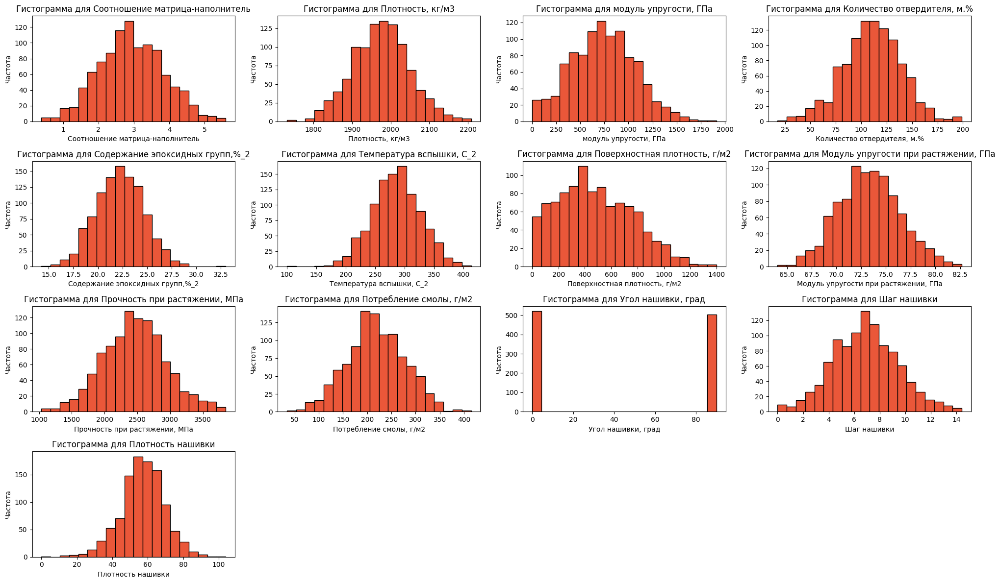

In [30]:
num_plots = 13
ncols = int(np.ceil(np.sqrt(num_plots)))  # Количество колонок
nrows = int(np.ceil(num_plots / ncols))   # Количество рядов


fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 12))
flattened_axes = axes.flatten()

for i, column in enumerate(names_columns):
    flattened_axes[i].hist(DS3[column], bins=20, color=Plashka[0], edgecolor='black')
    flattened_axes[i].set_title(f"Гистограмма для {column}")
    flattened_axes[i].set_xlabel(column)
    flattened_axes[i].set_ylabel("Частота")


# Удалите лишние подграфики
for j in range(num_plots, len(flattened_axes)):
    fig.delaxes(flattened_axes[j])

plt.tight_layout()
plt.show()

Гистограмма распределения (второй вариант)

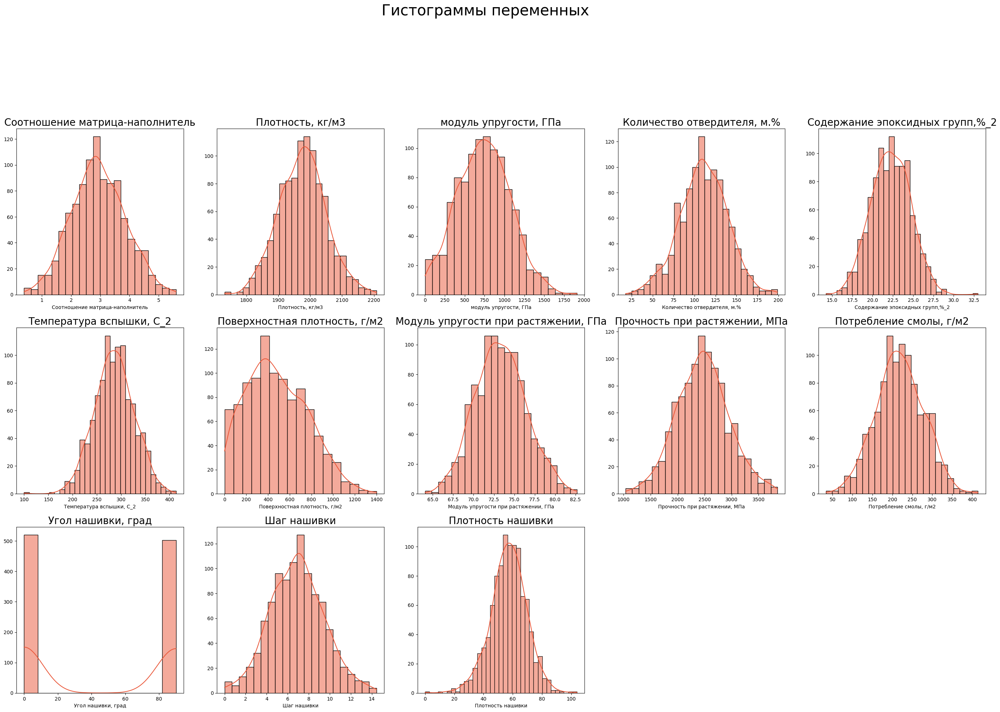

In [31]:
a = 5 # количество строк
b = 5 # количество столцбцов
c = 1 # инициализация plot counter
plt.figure(figsize = (35,35))
plt.suptitle('Гистограммы переменных', fontsize = 30)
for col in names_columns:
    plt.subplot(a, b, c)
    sns.histplot(data = DS3[col], kde=True, color = Plashka[0], edgecolor='black')
    plt.ylabel(None)
    plt.title(col, size = 20)
    c += 1

*После визуального анализа гистограмм мы можем сделать вывод, что данные стремятся к нормальному распределению. Сильно выделяются данныпе в графике Угол нашивки, но это обуслолвлено тем, что там всего два значения (0 и 90). Мжно заметить выбросы в представленных графиках: плотность, содержание эпоксидных групп, температура вспышки, плотность нашивки. Но визуально это можно пропустить, для этого мы будем использовать следующий инструмент "Ящик с Усами" и проверим его удобстов визуализации выбросов.*

Строим коробочную диаграмму " Ящик с усами"

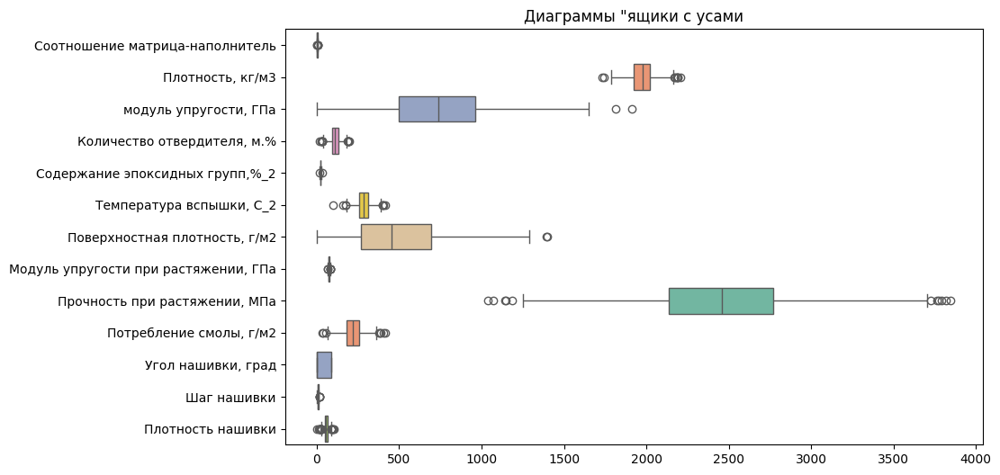

In [32]:
df=pd.DataFrame(DS3)

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, palette="Set2", orient="h")  # orient="h" для горизонтального ящика
plt.title('Диаграммы "ящики с усами')

plt.show()

*Постоив диаграмму " как есть", я понял, что все данные у меня лежат в разных диапозонах и поэтому "не читабельны", хотя и выбросы и визуализуруются.
В следующей попытке и буду использовать метод MinMaxScaler для маштабировани данных. MinMaxScaler нормализует данные, сжимая их в заданном диапазоне, обычно от 0 до 1. scaler.fit(DS3)вычислит минимальные и максимальные значения для каждого признака (столбца) в DS3. Эти значения будут использоваться для преобразования данных в диапазоне от 0 до 1.*

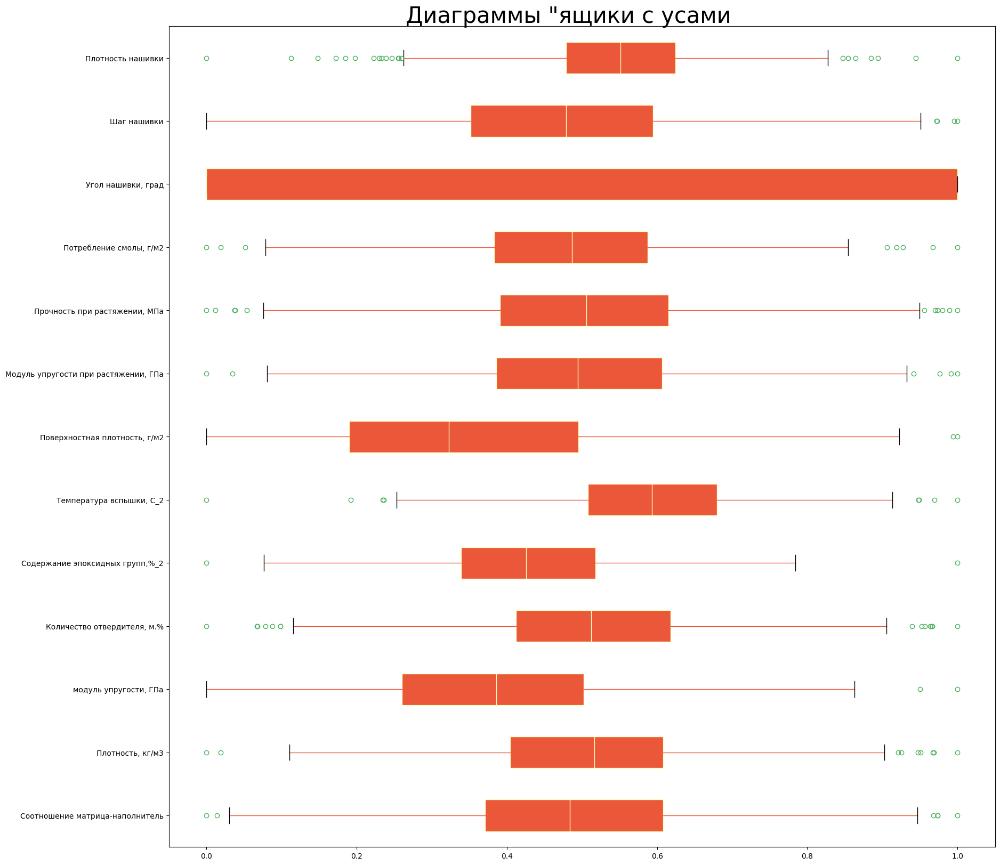

In [33]:
scaler = MinMaxScaler()
scaler.fit(DS3)

plt.figure(figsize = (20, 20))
plt.suptitle('Диаграммы "ящики с усами', y = 0.9 ,
             fontsize = 30)
plt.boxplot(pd.DataFrame(scaler.transform(DS3)),
             tick_labels=names_columns,
             patch_artist = True,
             meanline = True, 
             vert = False, 
             boxprops = dict(facecolor = Plashka[0], color = Plashka[2]),
             medianprops = dict(color = Plashka[2]), 
             whiskerprops = dict(color=Plashka[0]), 
             capprops = dict(color = "black"), 
             flierprops = dict(color = Plashka[4], 
            markeredgecolor = Plashka[4]))
plt.show()



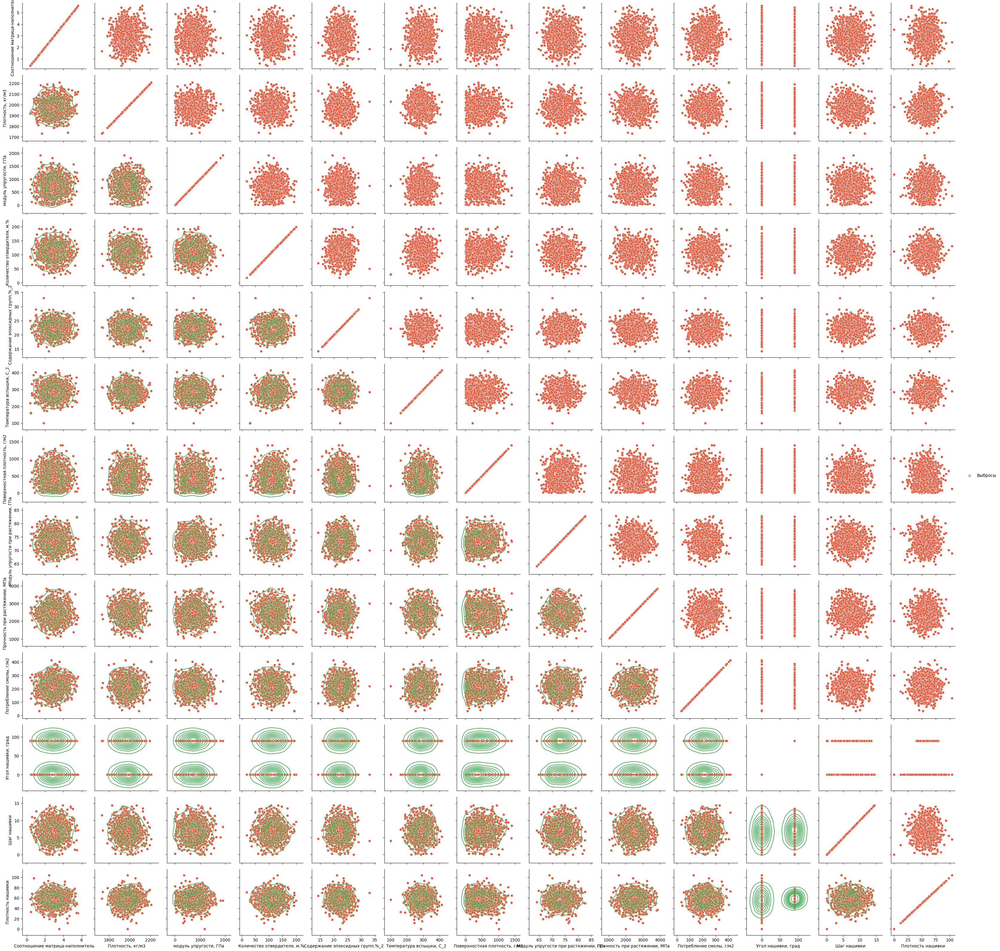

In [34]:

# Определяем выбросы на основе IQR
def detect_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (data < lower_bound) | (data > upper_bound)

# Создаем маску для выбросов
outliers_mask = detect_outliers(DS3[names_columns])

# Создаем PairGrid
g = sns.PairGrid(DS3[names_columns])

# Рисуем обычные точки
g.map(sns.scatterplot, color=Plashka[0])

# Подсвечиваем выбросы
for i in range(len(names_columns)):
    for j in range(len(names_columns)):
        if i != j:
            g.axes[i, j].scatter(DS3[names_columns][outliers_mask].iloc[:, j],
                                  DS3[names_columns][outliers_mask].iloc[:, i],
                                  color=Plashka[4], label='Выбросы', alpha=0.5)

# Рисуем KDE для нижней части. КДЕ(Kernel Density Estimation) — это метод оценки вероятностной. KDE работает, накладывая «ядро» (обычно это гауссовское ядро) в каждую точку данных и суммируя это ядро, Местоположение пиков : где объединены данные. Ширина распределения : на данный момент разбросаны данные. Выявление многодальности : наличие нескольких пиков в распределении.
g.map_lower(sns.kdeplot, color=Plashka[4])

# Отображаем легенду
g.add_legend()

plt.show()

На данном этапе мы провели разведовочный анализ данных (EDA): 
1. Произвели загрузку данных;
2. Выввели часть данных из таблиц для беглого ознакомления с данными приведёними в них (Выявив в них неинформативную чать, столбец "Unnamed:0" и удалили его);
3. Согласно поставленной задаче объеденили две таблицы по индексу по типу объединения -INNER
4. Проверили типы данных по столбцам;
5. Проверили отсутствие значений и % пропусков;
6. Произвели поиск уникальных значений в таблице ( был выявлен столбец "Угол нашивки, град" и его значения были заменены на бинароное значение для удобства);
7. Получили статистические данные;
8. Согласно поставленной задаче получили среднее, медианное значение для каждой колонки отдельно;
9. Вычислили коофециент корреляции;
10. Визуализировали и провели анализ с помощью гистограмм и "ящика с усами". Тем самым убедились, что данные стремятся к нормальному распределению, корреляция между признаками слабо вырожена.

Определяем кол-во выбросов тремя методами (Метод межквартильного размаха (IQR), Метод стандартного отклонения, Метод Z-оценка.)

In [35]:
# Примерный код для метода IQR
def detect_outliers_iqr(df):
    outliers = {}
    for column in df.select_dtypes(include=['float64', 'int']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[column] = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

outliers_iqr = detect_outliers_iqr(DS3)

In [36]:
# Примерный код для метода стандартного отклонения
def detect_outliers_std(df):
    outliers = {}
    for column in df.select_dtypes(include=['float64', 'int']).columns:
        mean = df[column].mean()
        std_dev = df[column].std()
        lower_bound = mean - 3 * std_dev
        upper_bound = mean + 3 * std_dev
        outliers[column] = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

outliers_std = detect_outliers_std(DS3)

In [37]:
# Примерный код для метода Z-оценки
def detect_outliers_zscore(df):
    outliers = {}
    for column in df.select_dtypes(include=['float64', 'int']).columns:
        z_scores = stats.zscore(df[column])
        outliers[column] = df[(z_scores > 3) | (z_scores < -3)]
    return outliers

outliers_zscore = detect_outliers_zscore(DS3)

In [38]:
# Выводим информацию по каждому методу для сравнения
def compare_outliers(outliers_iqr, outliers_std, outliers_zscore):
    comparison_data = []
    for column in outliers_iqr.keys():
        comparison_data.append({
            'Column': column,
            'IQR': len(outliers_iqr[column]),
            'Standard Deviation': len(outliers_std[column]),
            'Z-Score': len(outliers_zscore[column])
        })
    
    comparison_df = pd.DataFrame(comparison_data)
    return comparison_df

outlier_comparison_df = compare_outliers(outliers_iqr, outliers_std, outliers_zscore)
print(outlier_comparison_df)

                                  Column  IQR  Standard Deviation  Z-Score
0        Соотношение матрица-наполнитель    6                   0        0
1                       Плотность, кг/м3    9                   3        3
2                  модуль упругости, ГПа    2                   2        2
3            Количество отвердителя, м.%   14                   2        2
4        Содержание эпоксидных групп,%_2    2                   2        2
5               Температура вспышки, С_2    8                   3        3
6          Поверхностная плотность, г/м2    2                   2        2
7   Модуль упругости при растяжении, ГПа    6                   0        1
8          Прочность при растяжении, МПа   11                   0        0
9                Потребление смолы, г/м2    8                   3        3
10                    Угол нашивки, град    0                   0        0
11                           Шаг нашивки    4                   0        0
12                     Пл

*Из информации выше я вижу, что какого-то большова скопления выбросов в одном признаке не наблюдается. Метод IQR показал наибольшее кол-во выбросов (93), поэтому, будем использовать этот метод для удаления выбросов. И будем визуализировать уменьшение выбросов через "ящик с усам"*

Очитска от выбросов (1 раз)

In [39]:
def remove_outliers_iqr(df):
    for column in df.select_dtypes(include=['float64', 'int']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Удаляем выбросы
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

# Удаляем выбросы из датафрейма DS3
DS3_cleaned = remove_outliers_iqr(DS3)

# Выводим очищенный датафрейм
DS3_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 932 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       932 non-null    float64
 1   Плотность, кг/м3                      932 non-null    float64
 2   модуль упругости, ГПа                 932 non-null    float64
 3   Количество отвердителя, м.%           932 non-null    float64
 4   Содержание эпоксидных групп,%_2       932 non-null    float64
 5   Температура вспышки, С_2              932 non-null    float64
 6   Поверхностная плотность, г/м2         932 non-null    float64
 7   Модуль упругости при растяжении, ГПа  932 non-null    float64
 8   Прочность при растяжении, МПа         932 non-null    float64
 9   Потребление смолы, г/м2               932 non-null    float64
 10  Угол нашивки, град                    932 non-null    int64  
 11  Шаг нашивки            

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\1317449357.py:5: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),


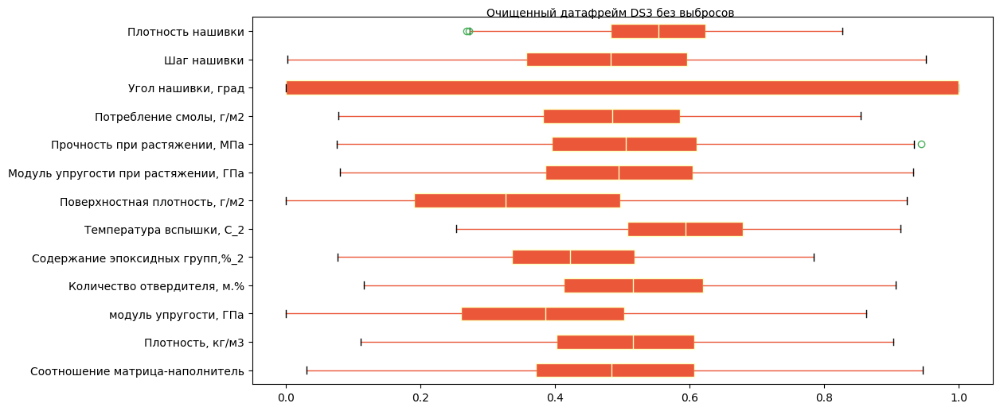

In [40]:

plt.figure(figsize = (12,6))
plt.suptitle('Очищенный датафрейм DS3 без выбросов', y = 0.9 ,fontsize = 10)


plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),
             labels = names_columns,
             patch_artist = True,
             meanline = True, 
             vert = False, 
             boxprops = dict(facecolor = Plashka[0], color = Plashka[2]),
             medianprops = dict(color = Plashka[2]), 
             whiskerprops = dict(color=Plashka[0]), 
             capprops = dict(color = "black"), 
             flierprops = dict(color = Plashka[4], 
            markeredgecolor = Plashka[4]))


plt.show()

*Наличие выбросов сократилось на 91 запись, но ещё визуализируются.Так как нет универсального ответа сколько нужно производить "чисток" без риска потери данных, будем проводить операцию пока на визуализации "ящик с усами" не посчитаем, что достаточно.*

Очитска отвыбросов (2 раз)

In [41]:
def remove_outliers_iqr(df):
    for column in df.select_dtypes(include=['float64', 'int']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Удаляем выбросы
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

# Удаляем выбросы из датафрейма DS3
DS3_cleaned = remove_outliers_iqr(DS3)
# Повторное удаление выбросов из очищенного датафрейма
DS3_cleaned = remove_outliers_iqr(DS3_cleaned)
# Выводим информацию о окончательно очищенном датафрейме
DS3_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 927 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       927 non-null    float64
 1   Плотность, кг/м3                      927 non-null    float64
 2   модуль упругости, ГПа                 927 non-null    float64
 3   Количество отвердителя, м.%           927 non-null    float64
 4   Содержание эпоксидных групп,%_2       927 non-null    float64
 5   Температура вспышки, С_2              927 non-null    float64
 6   Поверхностная плотность, г/м2         927 non-null    float64
 7   Модуль упругости при растяжении, ГПа  927 non-null    float64
 8   Прочность при растяжении, МПа         927 non-null    float64
 9   Потребление смолы, г/м2               927 non-null    float64
 10  Угол нашивки, град                    927 non-null    int64  
 11  Шаг нашивки            

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\2290880957.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),


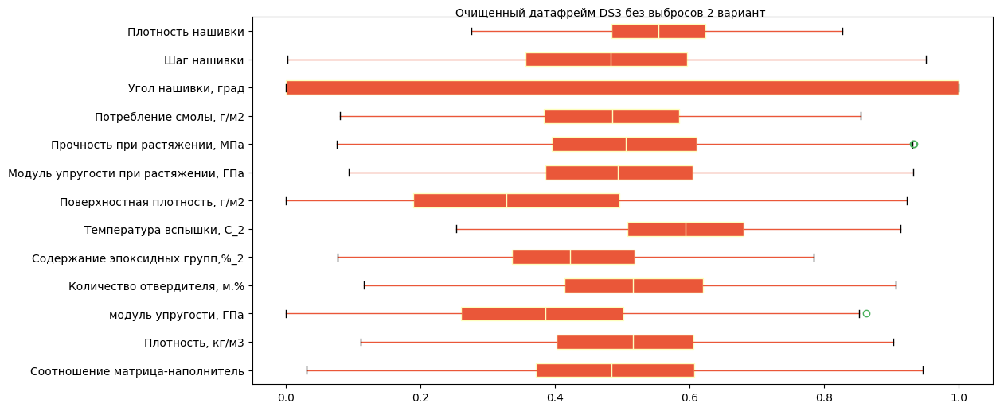

In [42]:
plt.figure(figsize=(12, 6))
plt.suptitle('Очищенный датафрейм DS3 без выбросов 2 вариант', y=0.9, fontsize=10)

plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),
             labels=names_columns,
             patch_artist=True,
             meanline=True, 
             vert=False, 
             boxprops=dict(facecolor=Plashka[0], color=Plashka[2]),
             medianprops=dict(color=Plashka[2]), 
             whiskerprops=dict(color=Plashka[0]), 
             capprops=dict(color="black"), 
             flierprops=dict(color=Plashka[4], markeredgecolor=Plashka[4]))
plt.show()

Очитска от выбросов (3 раз)

In [43]:
def remove_outliers_iqr(df):
    for column in df.select_dtypes(include=['float64', 'int']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Удаляем выбросы
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

# Удаляем выбросы из датафрейма DS3
DS3_cleaned = remove_outliers_iqr(DS3)
# Повторное удаление выбросов из очищенного датафрейма
DS3_cleaned = remove_outliers_iqr(DS3_cleaned)
# третье удаление выбросов из очищенного датафрейма
DS3_cleaned = remove_outliers_iqr(DS3_cleaned)
# Выводим информацию о окончательно очищенном датафрейме
DS3_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 921 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       921 non-null    float64
 1   Плотность, кг/м3                      921 non-null    float64
 2   модуль упругости, ГПа                 921 non-null    float64
 3   Количество отвердителя, м.%           921 non-null    float64
 4   Содержание эпоксидных групп,%_2       921 non-null    float64
 5   Температура вспышки, С_2              921 non-null    float64
 6   Поверхностная плотность, г/м2         921 non-null    float64
 7   Модуль упругости при растяжении, ГПа  921 non-null    float64
 8   Прочность при растяжении, МПа         921 non-null    float64
 9   Потребление смолы, г/м2               921 non-null    float64
 10  Угол нашивки, град                    921 non-null    int64  
 11  Шаг нашивки            

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\926722704.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),


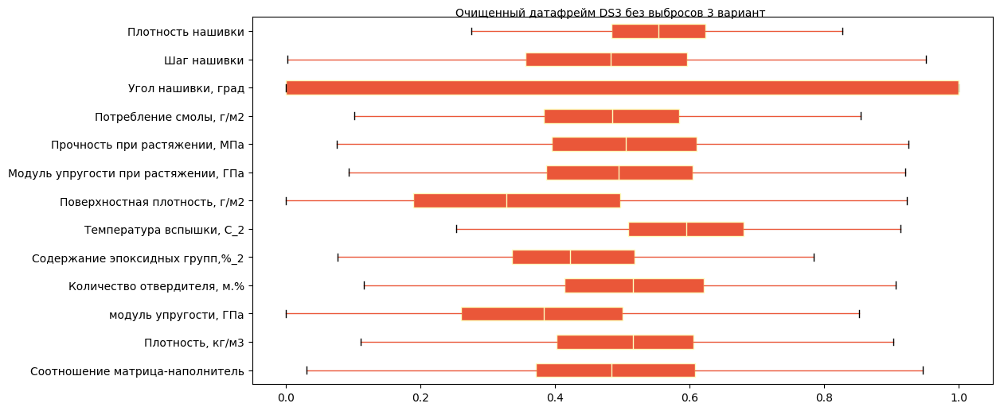

In [44]:
plt.figure(figsize=(12, 6))
plt.suptitle('Очищенный датафрейм DS3 без выбросов 3 вариант', y=0.9, fontsize=10)

plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),
             labels=names_columns,
             patch_artist=True,
             meanline=True, 
             vert=False, 
             boxprops=dict(facecolor=Plashka[0], color=Plashka[2]),
             medianprops=dict(color=Plashka[2]), 
             whiskerprops=dict(color=Plashka[0]), 
             capprops=dict(color="black"), 
             flierprops=dict(color=Plashka[4], markeredgecolor=Plashka[4]))
plt.show()

*Понял, что можно очитску сделать циклом и провести эту операцию, пока выбросов не останется. Проверим в примере ниже.*

<class 'pandas.core.frame.DataFrame'>
Index: 921 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       921 non-null    float64
 1   Плотность, кг/м3                      921 non-null    float64
 2   модуль упругости, ГПа                 921 non-null    float64
 3   Количество отвердителя, м.%           921 non-null    float64
 4   Содержание эпоксидных групп,%_2       921 non-null    float64
 5   Температура вспышки, С_2              921 non-null    float64
 6   Поверхностная плотность, г/м2         921 non-null    float64
 7   Модуль упругости при растяжении, ГПа  921 non-null    float64
 8   Прочность при растяжении, МПа         921 non-null    float64
 9   Потребление смолы, г/м2               921 non-null    float64
 10  Угол нашивки, град                    921 non-null    int64  
 11  Шаг нашивки            

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\3454620846.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),


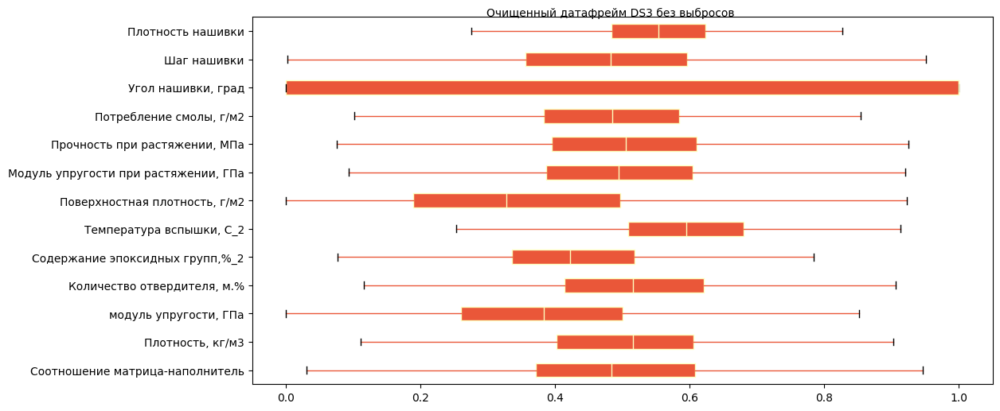

In [45]:
def remove_outliers_iqr(df):
    while True:
        initial_shape = df.shape  # Сохраняем начальную форму датафрейма
        for column in df.select_dtypes(include=['float64', 'int']).columns:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Удаляем выбросы
            df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
        
        # Проверяем, изменился ли датафрейм
        if df.shape == initial_shape:
            break  # Выход из цикла, если форма не изменилась
    return df

# Удаляем выбросы из датафрейма DS3
DS3_cleaned = remove_outliers_iqr(DS3)

# Выводим информацию о окончательно очищенном датафрейме
DS3_cleaned.info()

# Визуализация очищенного датафрейма
plt.figure(figsize=(12, 6))
plt.suptitle('Очищенный датафрейм DS3 без выбросов', y=0.9, fontsize=10)

plt.boxplot(pd.DataFrame(scaler.transform(DS3_cleaned)),
             labels=names_columns,
             patch_artist=True,
             meanline=True, 
             vert=False, 
             boxprops=dict(facecolor=Plashka[0], color=Plashka[2]),
             medianprops=dict(color=Plashka[2]), 
             whiskerprops=dict(color=Plashka[0]), 
             capprops=dict(color="black"), 
             flierprops=dict(color=Plashka[4], markeredgecolor=Plashka[4]))
plt.show()

*После трёх удалений выбросов, я больше не вижу выбросов на графике "ящик с усами" и это подтвердил код выше с циклом. В итоге от первоначальных данных ( 1023 строки) осталось 921 строка, тем самым удалили 102 строку, что составило 9,97% от общей информации.*

In [46]:
folder_path = 'C:/Users/USER/Desktop/DS for BKP'  
file_name = 'df_cleaned_dat.xlsx' 
file_path = os.path.join(folder_path, file_name)

DS3_cleaned.to_excel(file_path, index=False)



*Мы опробуем несколько вариантов НОРМАЛИЗАЦИИ: MinMaxScaler, Normalizer, MaxAbsScaler, RobustScaler, сравним их точность и выберем лучший результат.*

<Axes: ylabel='Density'>

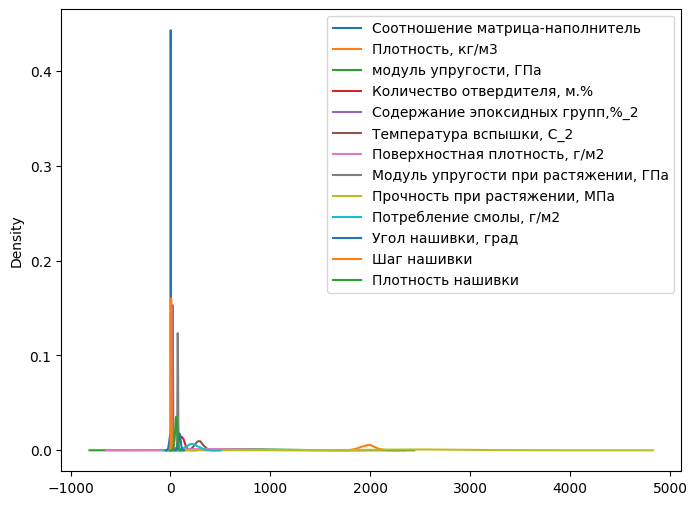

In [47]:
fig, ax = plt.subplots(figsize = (8, 6))
DS3_cleaned.plot(kind = 'kde', ax = ax)

*Наши изначальные данные находятся в разных диапазонах. Приступаем к нескольким вариантам НОРМАЛИЗАЦИИ*

In [48]:
# Нормализация данных MinMaxScaler
scaler_minmax = MinMaxScaler()
DS3_normalized_1= pd.DataFrame(scaler_minmax.fit_transform(DS3_cleaned), columns=DS3_cleaned.columns)

*Этот метод является простым и эффективным инструментом для нормализации данных, который может значительно улучшить результаты машинного обучения ваших моделей*

<Axes: ylabel='Density'>

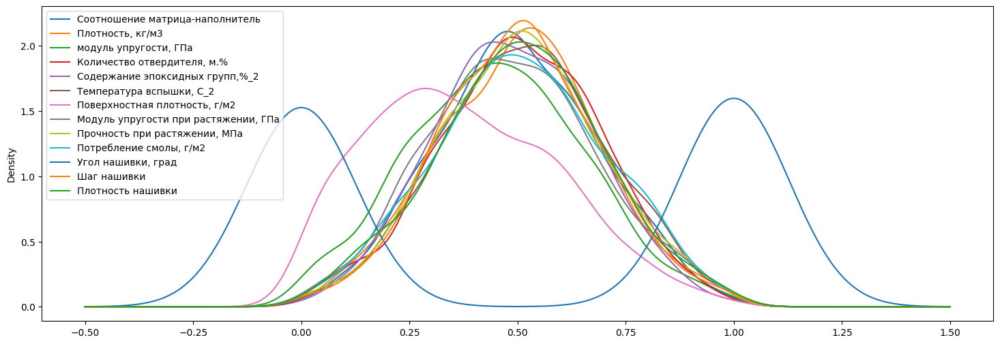

In [49]:
fig, ax = plt.subplots(figsize = (18, 6))
DS3_normalized_1.plot(kind = 'kde', ax = ax)

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\2516052855.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(DS3_normalized_1, labels=DS3_normalized_1.columns, patch_artist=True)


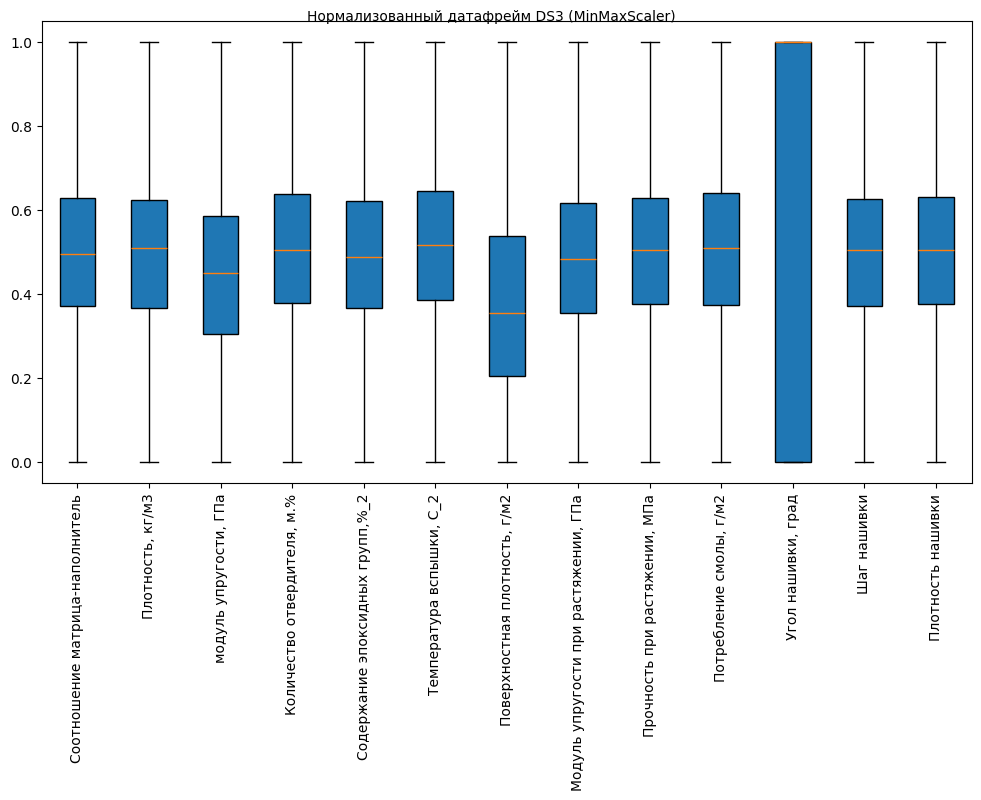

In [50]:
plt.figure(figsize=(12, 6))
plt.suptitle('Нормализованный датафрейм DS3 (MinMaxScaler)', y=0.9, fontsize=10)
plt.boxplot(DS3_normalized_1, labels=DS3_normalized_1.columns, patch_artist=True)
plt.xticks(rotation=90)
plt.show()

In [51]:
# Нормализация данных RobustScaler
scaler_robust = RobustScaler()
DS3_normalized_2 = pd.DataFrame(scaler_robust.fit_transform(DS3_cleaned), columns=DS3_cleaned.columns)

*Этот метод использует медиану и межквартильный размах для нормализации, что делает его устойчивым к выбросам. Это может быть полезно, если наши данные содержат аномалии.*

<Axes: ylabel='Density'>

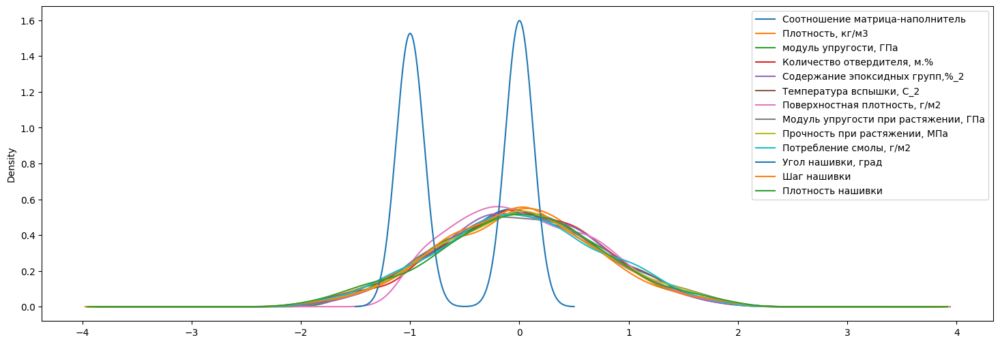

In [52]:
fig, ax = plt.subplots(figsize = (18, 6))
DS3_normalized_2.plot(kind = 'kde', ax = ax)

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\489400670.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(DS3_normalized_2, labels=DS3_normalized_1.columns, patch_artist=True)


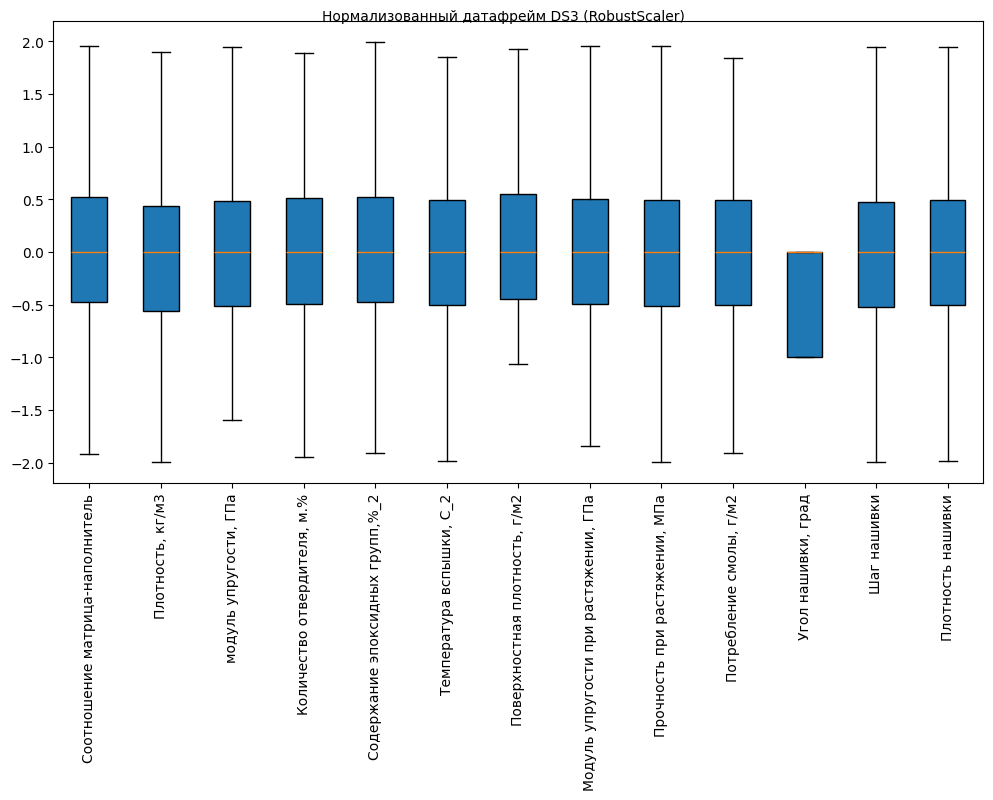

In [53]:
plt.figure(figsize=(12, 6))
plt.suptitle('Нормализованный датафрейм DS3 (RobustScaler)', y=0.9, fontsize=10)
plt.boxplot(DS3_normalized_2, labels=DS3_normalized_1.columns, patch_artist=True)
plt.xticks(rotation=90)
plt.show()

In [54]:
scaler_maxabs = MaxAbsScaler()
DS3_normalized_3 = pd.DataFrame(scaler_maxabs.fit_transform(DS3_cleaned), columns=DS3_cleaned.columns)

*Этот метод масштабирует данные, обеспечивая их максимальное значение, сохраняя разреженность данных. Это может быть полезно для разреженных матриц.*

<Axes: ylabel='Density'>

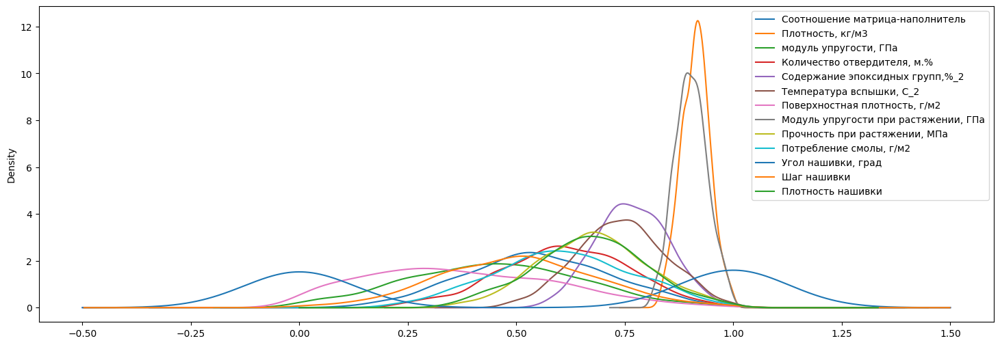

In [55]:
fig, ax = plt.subplots(figsize = (18, 6))
DS3_normalized_3.plot(kind = 'kde', ax = ax)

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\2510183610.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(DS3_normalized_3, labels=DS3_normalized_1.columns, patch_artist=True)


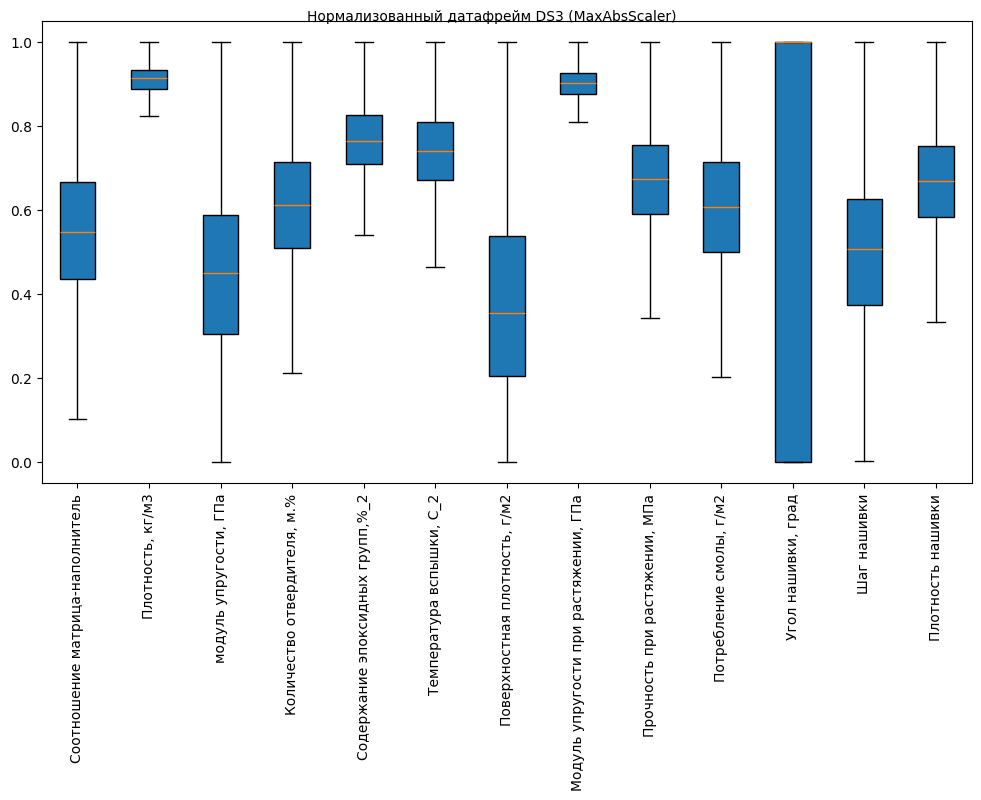

In [56]:
plt.figure(figsize=(12, 6))
plt.suptitle('Нормализованный датафрейм DS3 (MaxAbsScaler)', y=0.9, fontsize=10)
plt.boxplot(DS3_normalized_3, labels=DS3_normalized_1.columns, patch_artist=True)
plt.xticks(rotation=90)
plt.show()

In [57]:
normalizer = Normalizer(norm='l2') 
DS3_normalized_4 = pd.DataFrame(normalizer.fit_transform(DS3_cleaned), columns=DS3_cleaned.columns)

*Этот метод нормализует данные по одной длине, что может быть полезно при решении задач, связанных с расстояниями, например, при кластеризации.*

<Axes: ylabel='Density'>

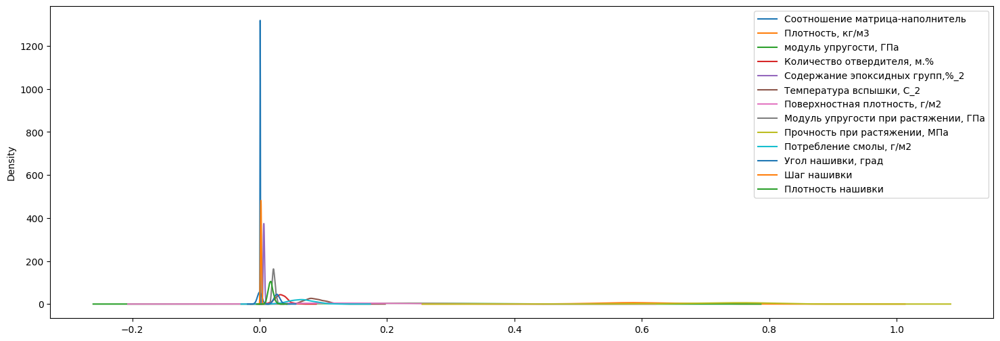

In [58]:
fig, ax = plt.subplots(figsize = (18, 6))
DS3_normalized_4.plot(kind = 'kde', ax = ax)

C:\Users\USER\AppData\Local\Temp\ipykernel_3276\2687379591.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(DS3_normalized_4, labels=DS3_normalized_1.columns, patch_artist=True)


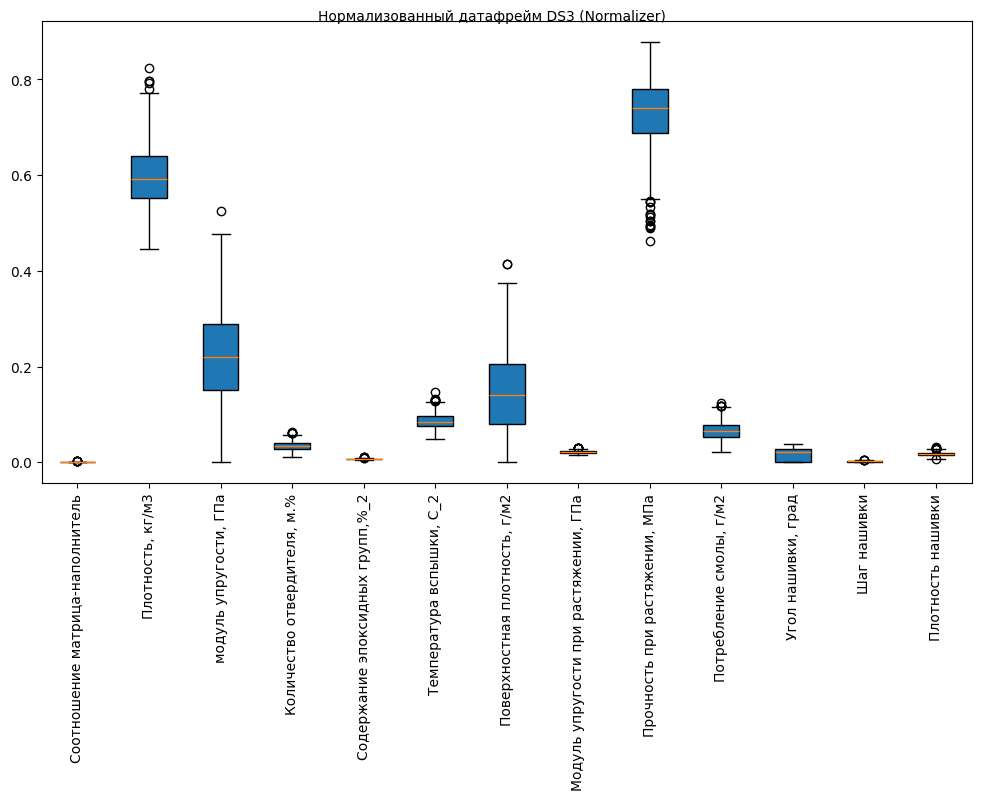

In [59]:
plt.figure(figsize=(12, 6))
plt.suptitle('Нормализованный датафрейм DS3 (Normalizer)', y=0.9, fontsize=10)
plt.boxplot(DS3_normalized_4, labels=DS3_normalized_1.columns, patch_artist=True)
plt.xticks(rotation=90)
plt.show()

*Опробовав несколько методов делаем вывод, что нам могут подойти MinMaxScaler и RobustScaler.   MaxAbsScaler показал "рассеивание" по графику, а Normalizer показал выбросы.*

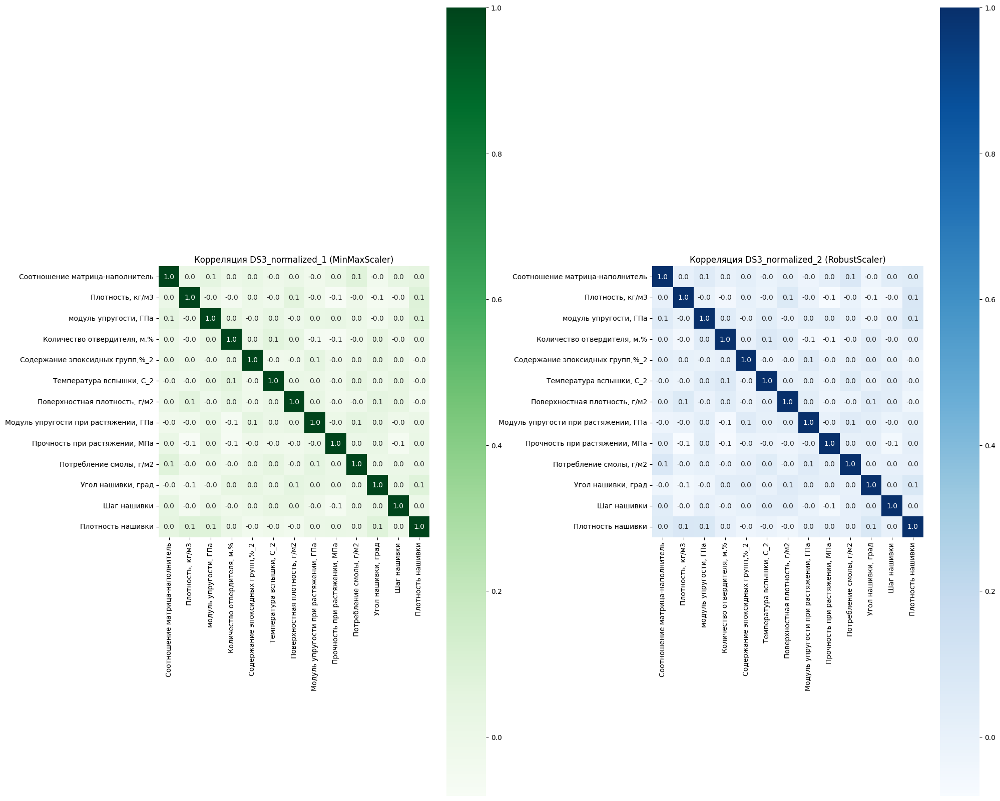

In [60]:
# Создаем фигуру с двумя подграфиками
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))

# Тепловая карта для первого датафрейма
sns.heatmap(DS3_normalized_1.corr(), ax=axes[0],fmt=".1f", annot=True, cmap='Greens', square=True, cbar_kws={"shrink": .8})
axes[0].set_title('Корреляция DS3_normalized_1 (MinMaxScaler)')

# Тепловая карта для второго датафрейма
sns.heatmap(DS3_normalized_2.corr(), ax=axes[1],fmt=".1f", annot=True, cmap='Blues', square=True, cbar_kws={"shrink": .8})
axes[1].set_title('Корреляция DS3_normalized_2 (RobustScaler)')

# Настройка отображения
plt.tight_layout()
plt.show()

*Проведя Нормализацию и сравнив два вариант (на графиках выше) я склоняюсь к методу MinMaxScaler, т.к. он является  простым и эффективным инструментом для нормализации данных, который может значительно улучшить результаты машинного обучения ваших моделей. Предворительно, мы очистили данные от "выбросов" и подготовили данные. Последующая стандартизация может не вернуть данные к их исходному распределению. Это может привести к потере информации об изменениях в данных. Поэтому проводить её не будем.*

*После всех подготовительных работ я сохраняю объединённые, ошищенные и нормализованные данные в двух форматах.*

In [61]:
folder_path = 'C:/Users/USER/Desktop/DS for BKP'  
file_name = 'df_pared_dat.xlsx' 
file_path = os.path.join(folder_path, file_name)

DS3_normalized_1.to_excel(file_path, index=False)

In [62]:
file_name1 = 'df_pared_dat.csv' 
file_path1 = os.path.join(folder_path, file_name1)

DS3_normalized_1.to_csv(file_path1,encoding='cp1251')

# Шаг 2 - Начинаем процесс создания и обучения моделей.

*Задача: Обучить нескольких моделей для прогноза модуля упругости при растяжении и прочности при растяжении. При построении модели необходимо 30% данных оставить на тестирование модели, на остальных происходит обучение моделей. При построении моделей провести поиск гиперпараметров модели с помощью поиска по сетке с перекрестной проверкой, количество блоков равно 10.*

*Будем использовать методы:*
    1) Линейная регрессия-LinearRegression;
    2) Хребет-Ridge;
    3) Опорные вектора-SVR;
    4) Случайный_лес-RandomForestRegressor;
    5) Градиентный бустинг-GradientBoostingRegressor.

    *Этот набор методов будет идентичен для прогназиования "модуля упругости при растяжении" и "прочности при растяжении"*

Критериипо которым будет проводится оценка:
Наимобее часто используемый метод среднеквадратичная ошибка (MSE). Значения данного показателя в идиале должны стремится к 0.
Оценка R2 – это один из показателей оценки эффективности моделей машинного обучения на основе регрессии.Суть его работы заключается в измерении количества отклонений в прогнозах, объясненных набором данных. Проще говоря, это разница между выборками в наборе данных и прогнозами, сделанными моделью. Значения данного показателя в идиале должны стремится к 1. (На практике модель, для которой R2 > 0,5, считается удовлетворительной, если R2 > 0,8 — очень хорошей, а значения, меньшие 0,5, говорят о том, что модель плохая.)

# Прогноз для "модуля упругости при растяжении"

In [63]:
# Загрузка данных
df = pd.read_excel('df_pared_dat.xlsx')

In [64]:
# Выделение признаков и целевой переменной
X = df.drop(columns=['Модуль упругости при растяжении, ГПа'])  # Удаляем целевую переменную
y = df['Модуль упругости при растяжении, ГПа']

# Выведем формы X и y, чтобы убедиться, что разделение выполнено корректно
X.shape, y.shape

((921, 12), (921,))

In [65]:
# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [66]:
# Создаём словарь для хранения моделей и их результатов
models = {
    'Линейная регрессия': LinearRegression(),
    'Хребет': Ridge(),
    'Опорные вектора': SVR(),
    'Случайный_лес': RandomForestRegressor(),
    'Градиентный бустинг ': GradientBoostingRegressor()}

In [67]:
# Гиперпараметры для поиска
param_grids = {
    'Линейная регрессия':{'fit_intercept': [True, False]},
    'Хребет' : {'alpha': [0.1, 1.0, 10.0]},
    'Опорные вектора': {'C': [0.1, 1, 10, 100],'epsilon': [0.1, 0.2, 0.5],'kernel': ['linear', 'rbf'],'gamma': ['scale', 'auto']},
    'Случайный_лес': {'n_estimators': [100, 200], 'max_depth': [5, 10, None]},
    'Градиентный бустинг': {'n_estimators': [100, 200], 'learning_rate': [0.01, 0.1], 'max_depth': [3, 5]}
}

In [68]:
#Запускаем поиск через GridSearchCV 10 блоков, если таковые есть
best_models = {}
for name, model in models.items():
    if name in param_grids:  # Если есть гиперпараметры для поиска
        grid = GridSearchCV(model, param_grids[name], cv=10, scoring='neg_mean_squared_error')
        grid.fit(X_train, y_train)
        best_models[name] = grid.best_estimator_
        print(f"Лучшие параметры для {name}: {grid.best_params_}")

Лучшие параметры для Линейная регрессия: {'fit_intercept': True}
Лучшие параметры для Хребет: {'alpha': 10.0}
Лучшие параметры для Опорные вектора: {'C': 0.1, 'epsilon': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
Лучшие параметры для Случайный_лес: {'max_depth': 5, 'n_estimators': 100}


In [69]:
#Обучение моделй с оптимальными гипперпараметрами
model.fit(X_train, y_train)
best_models[name] = model

In [70]:
results = {}
# Оценка моделей на тестовой выборке (!)
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100  # MAPE в процентах
    test_score = model.score(X_test, y_test)  # Тестовый балл R^2 на тестовых данных


     # Сохранение результатов
    results[name] = {
        'R^2': round(r2, 2),
        'MAE': round(mae, 2),
        'MSE': round(mse, 2),
        'MAPE': round(mape, 2),
        'Test Score': round(test_score, 2)
    }

    # Преобразование результатов в DataFrame для удобного отображения
results_df = pd.DataFrame(results).T
print(results_df)


                       R^2   MAE   MSE   MAPE  Test Score
Линейная регрессия   -0.00  0.16  0.04  64.45       -0.00
Хребет                0.00  0.16  0.04  64.51        0.00
Опорные вектора      -0.01  0.16  0.04  66.38       -0.01
Случайный_лес        -0.01  0.16  0.04  65.10       -0.01
Градиентный бустинг  -0.06  0.16  0.04  66.59       -0.06


*Попробуем визуализировать соотношения наших тестовых и обученных выборок*

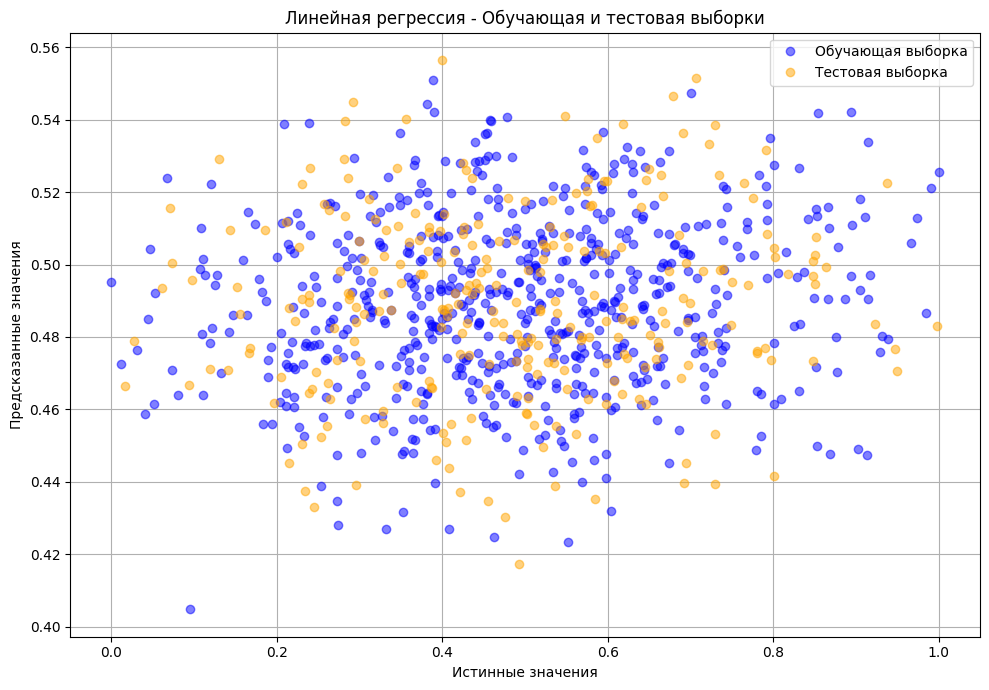

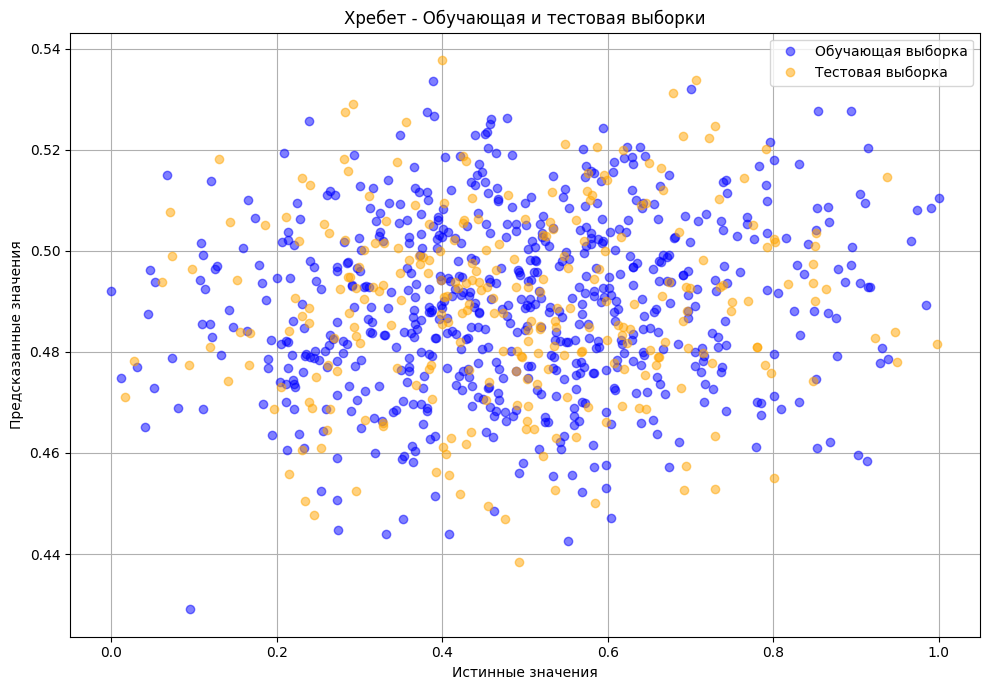

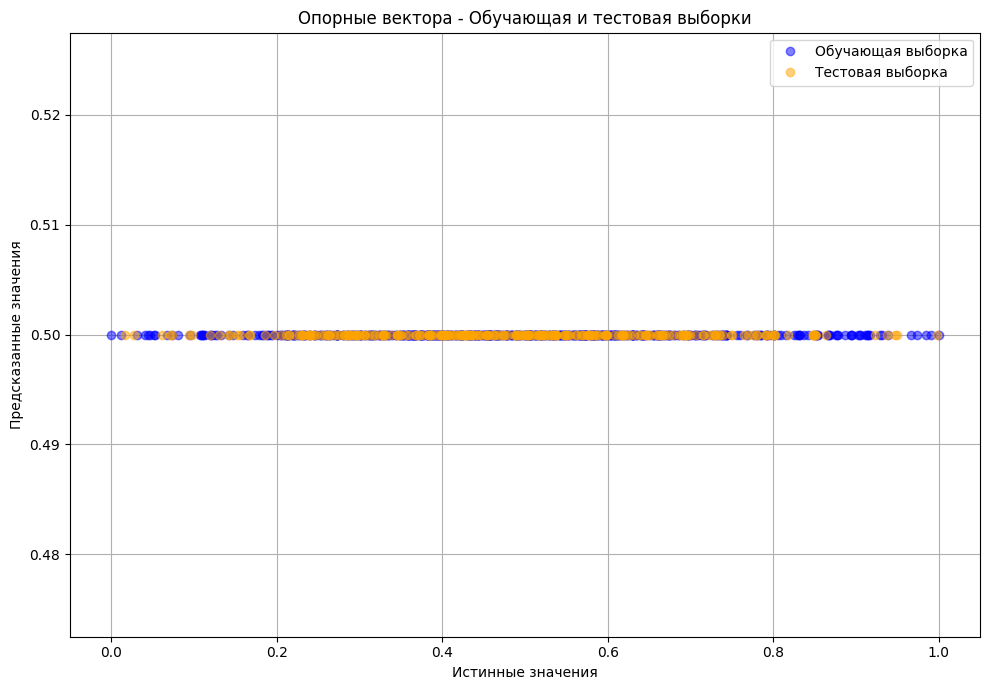

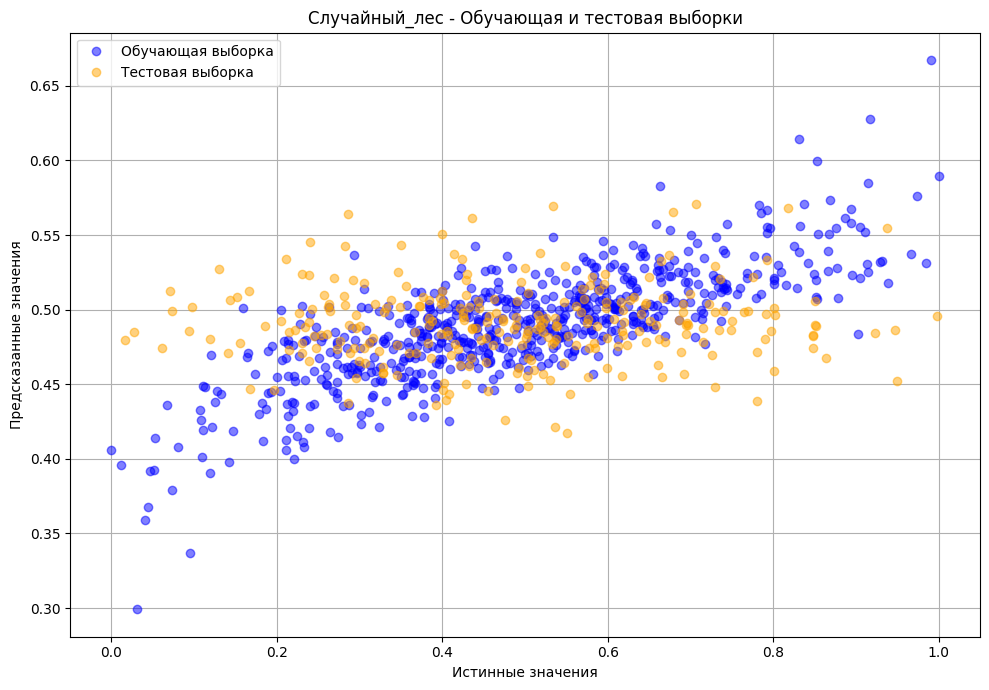

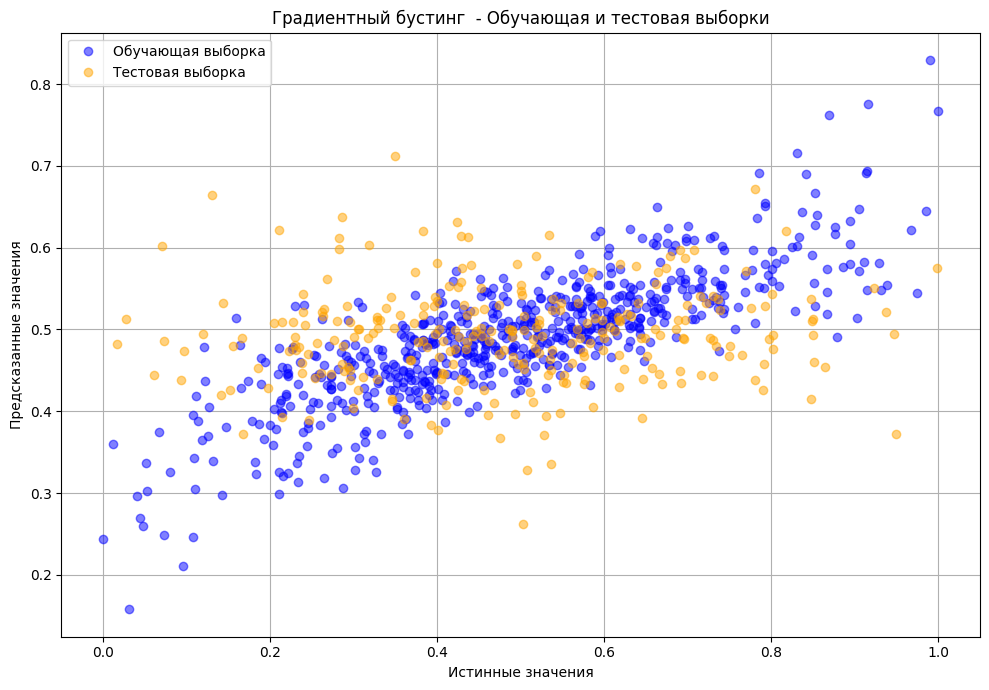

In [71]:
for name, model in best_models.items():
    # Предсказания на обучающей и тестовой выборках
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Построение графиков
    plt.figure(figsize=(10, 7))
    
    # График для обучающей выборки
    plt.title(f"{name} - Обучающая и тестовая выборки")
    plt.plot(y_train, y_train_pred, 'o', label='Обучающая выборка', color='blue', alpha=0.5)
    plt.plot(y_test, y_test_pred, 'o', label='Тестовая выборка', color='orange', alpha=0.5)
        
    plt.xlabel("Истинные значения")
    plt.ylabel("Предсказанные значения")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

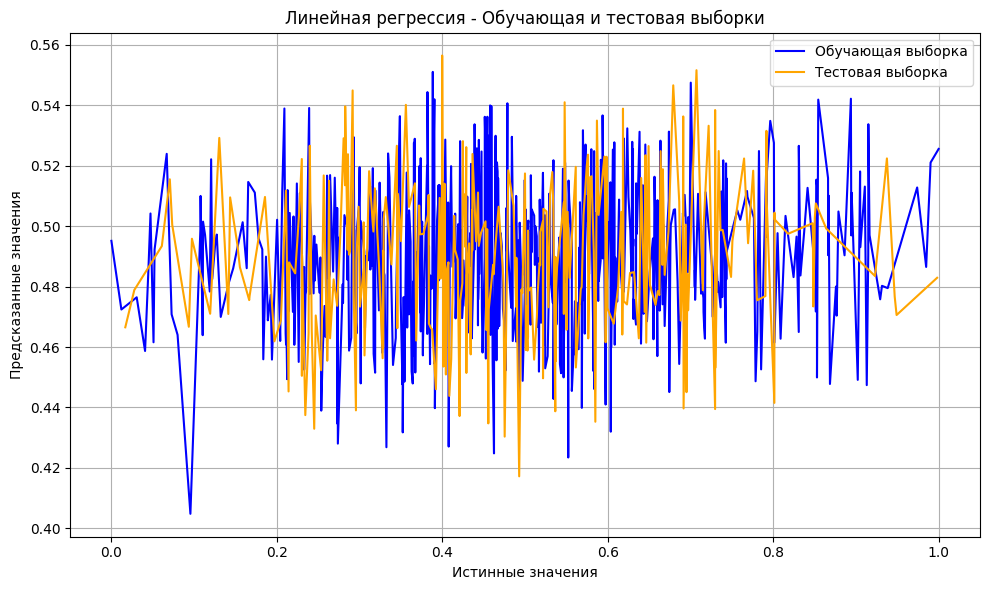

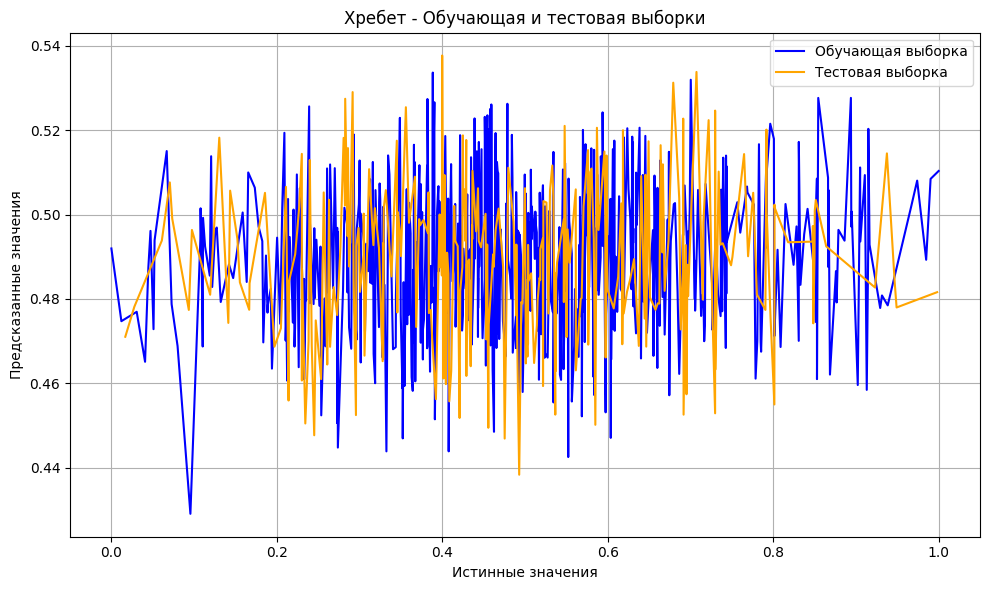

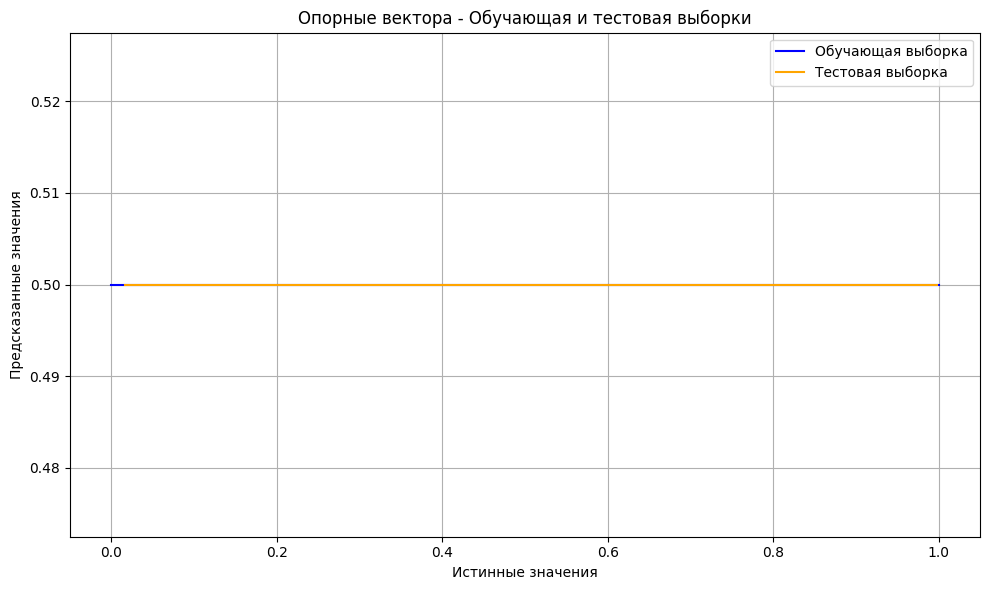

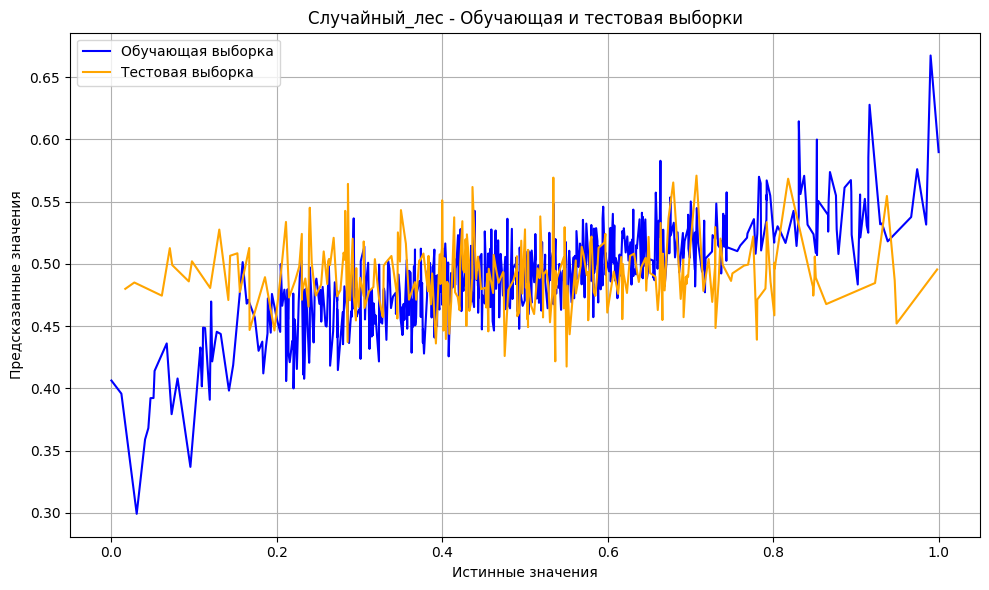

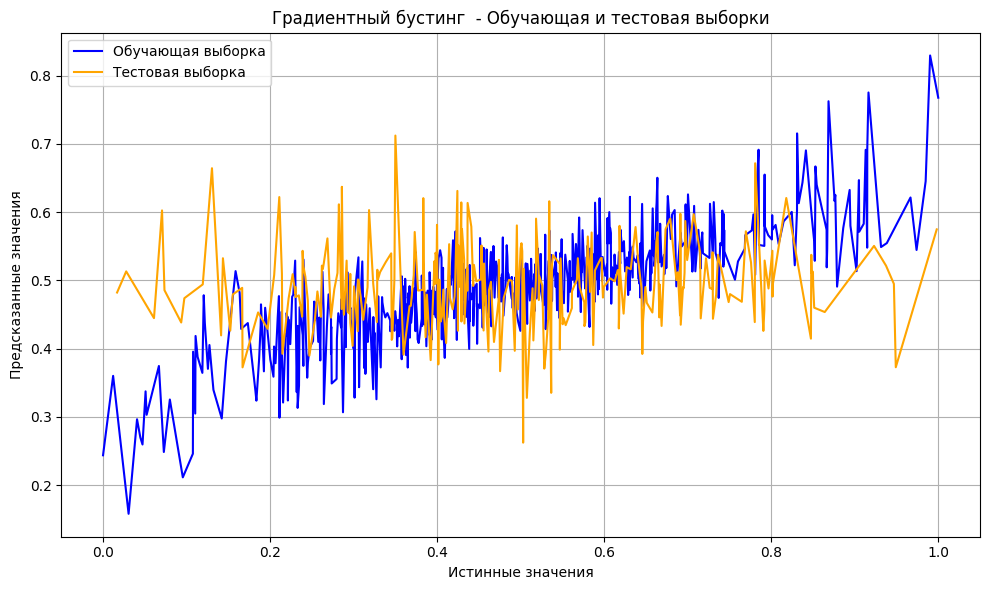

In [72]:
# Предсказания и графики для каждой модели
for name, model in best_models.items():
    # Предсказания на обучающей и тестовой выборках
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Построение графиков
    plt.figure(figsize=(10, 6))
    
    # Сортируем значения для более гладкой линии
    sorted_indices_train = np.argsort(y_train)
    sorted_indices_test = np.argsort(y_test)

    # График для обучающей выборки
    plt.title(f"{name} - Обучающая и тестовая выборки")
    plt.plot(y_train.iloc[sorted_indices_train], y_train_pred[sorted_indices_train], label='Обучающая выборка', color='blue')
    plt.plot(y_test.iloc[sorted_indices_test], y_test_pred[sorted_indices_test], label='Тестовая выборка', color='orange')
     
    plt.xlabel("Истинные значения")
    plt.ylabel("Предсказанные значения")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Прогноз для "прочность при растяжении"

In [73]:
# Выделение признаков и целевой переменной
X = df.drop(columns=['Прочность при растяжении, МПа'])  # Удаляем целевую переменную
y = df['Прочность при растяжении, МПа']

# Выведем формы X и y, чтобы убедиться, что разделение выполнено корректно
X.shape, y.shape

((921, 12), (921,))

In [74]:
# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [75]:
# Создаём словарь для хранения моделей и их результатов
models = {
    'Линейная регрессия': LinearRegression(),
    'Хребет': Ridge(),
    'Опорные вектора': SVR(),
    'Случайный_лес': RandomForestRegressor(),
    'Градиентный бустинг ': GradientBoostingRegressor()}

In [76]:
# Гиперпараметры для поиска
param_grids = {
    'Линейная регрессия':{'fit_intercept': [True, False]},
    'Хребет' : {'alpha': [0.1, 1.0, 10.0]},
    'Опорные вектора': {'C': [0.1, 1, 10, 100],'epsilon': [0.1, 0.2, 0.5],'kernel': ['linear', 'rbf'],'gamma': ['scale', 'auto']},
    'Случайный_лес': {'n_estimators': [100, 200], 'max_depth': [5, 10, None]},
    'Градиентный бустинг': {'n_estimators': [100, 200], 'learning_rate': [0.01, 0.1], 'max_depth': [3, 5]}
}

In [77]:
#Запускаем поиск через GridSearchCV 10 блоков, если таковые есть
best_models = {}
for name, model in models.items():
    if name in param_grids:  # Если есть гиперпараметры для поиска
        grid = GridSearchCV(model, param_grids[name], cv=10, scoring='neg_mean_squared_error')
        grid.fit(X_train, y_train)
        best_models[name] = grid.best_estimator_
        print(f"Лучшие параметры для {name}: {grid.best_params_}")

Лучшие параметры для Линейная регрессия: {'fit_intercept': True}
Лучшие параметры для Хребет: {'alpha': 10.0}
Лучшие параметры для Опорные вектора: {'C': 0.1, 'epsilon': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
Лучшие параметры для Случайный_лес: {'max_depth': None, 'n_estimators': 200}


In [78]:
#Обучение моделй соптимальными гипперпараметрами
model.fit(X_train, y_train)
best_models[name] = model

In [79]:
results = {}
# Оценка моделей на тестовой выборке (!)
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100  # MAPE в процентах
    test_score = model.score(X_test, y_test)  # Тестовый балл R^2 на тестовых данных


     # Сохранение результатов
    results[name] = {
        'R^2': round(r2, 2),
        'MAE': round(mae, 2),
        'MSE': round(mse, 2),
        'MAPE': round(mape, 2),
        'Test Score': round(test_score, 2)
    }

    # Преобразование результатов в DataFrame для удобного отображения
results_df = pd.DataFrame(results).T
print(results_df)

                       R^2   MAE   MSE  MAPE  Test Score
Линейная регрессия    0.00  0.16  0.04   inf        0.00
Хребет                0.00  0.16  0.04   inf        0.00
Опорные вектора      -0.00  0.16  0.04   inf       -0.00
Случайный_лес        -0.04  0.16  0.04   inf       -0.04
Градиентный бустинг  -0.02  0.16  0.04   inf       -0.02


*Попробуем визуализировать соотношения наших тестовых и обученных выборок*

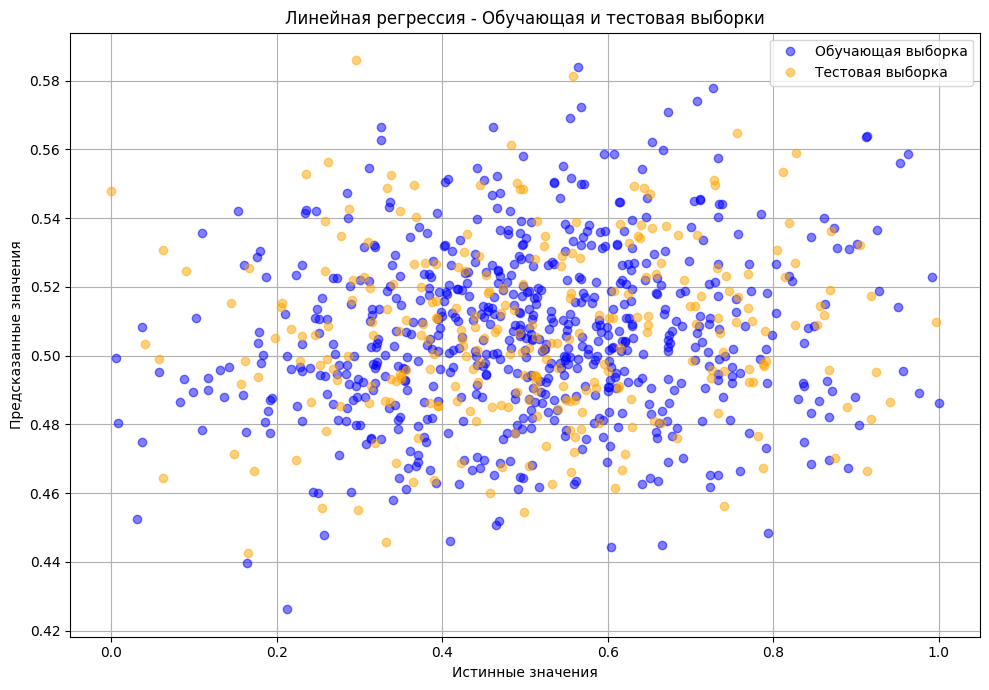

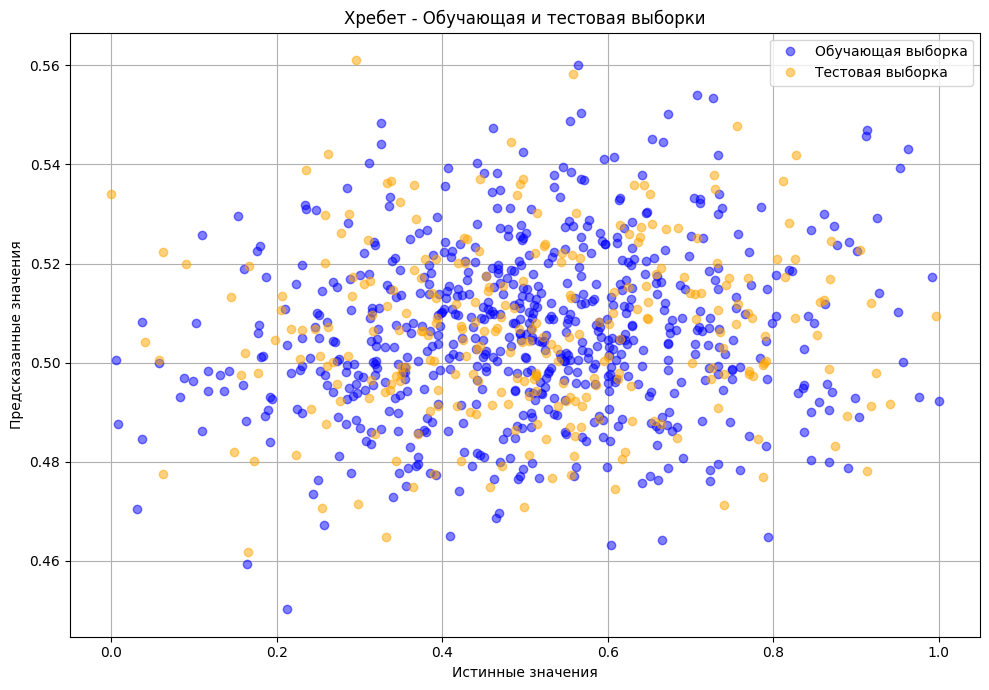

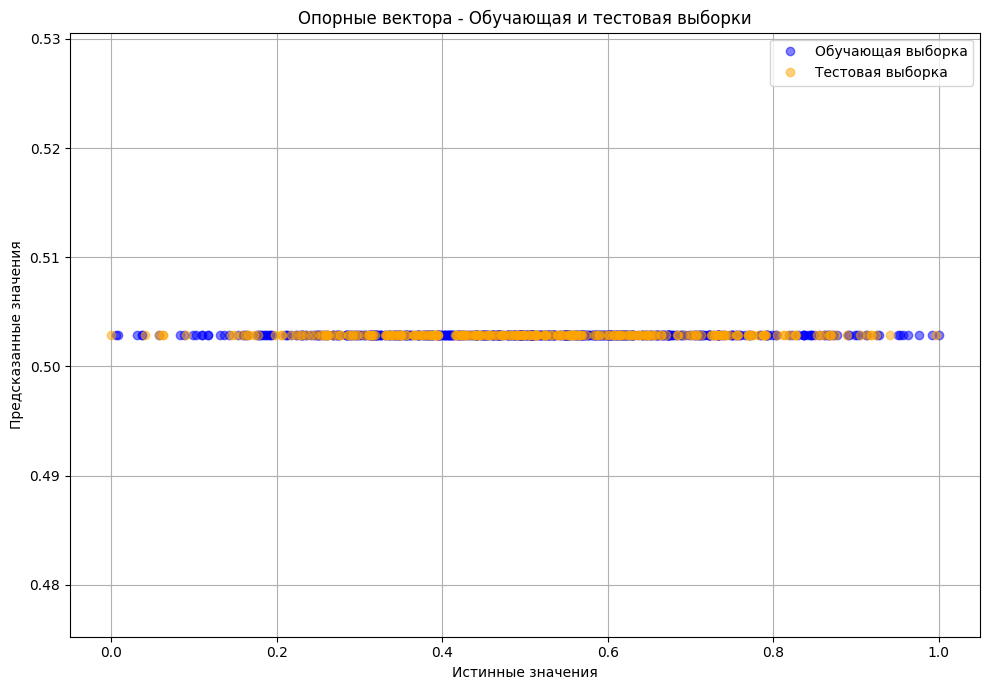

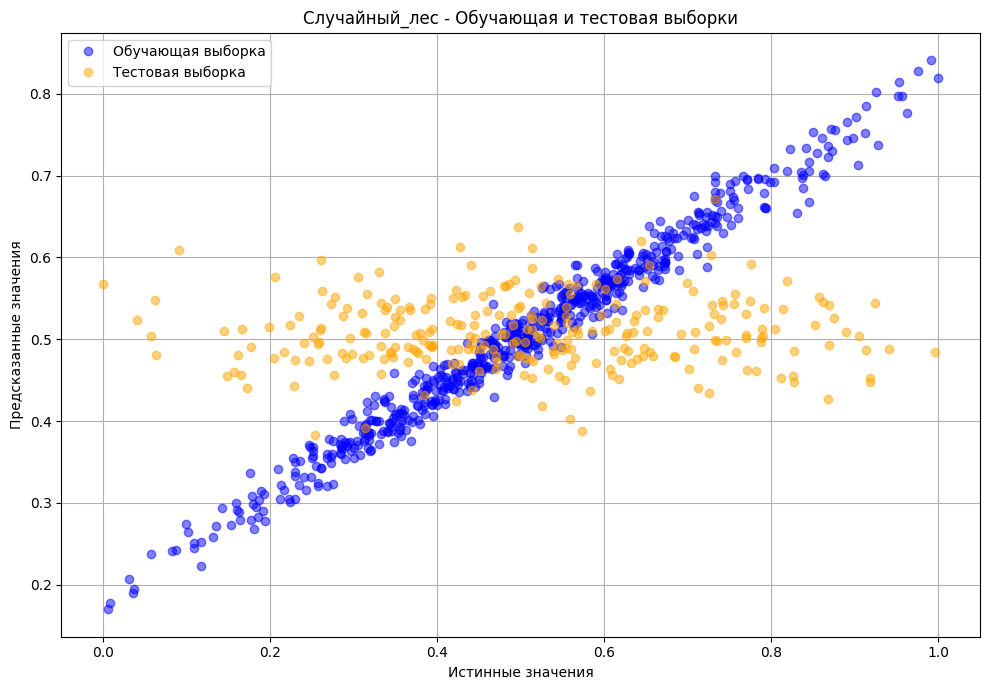

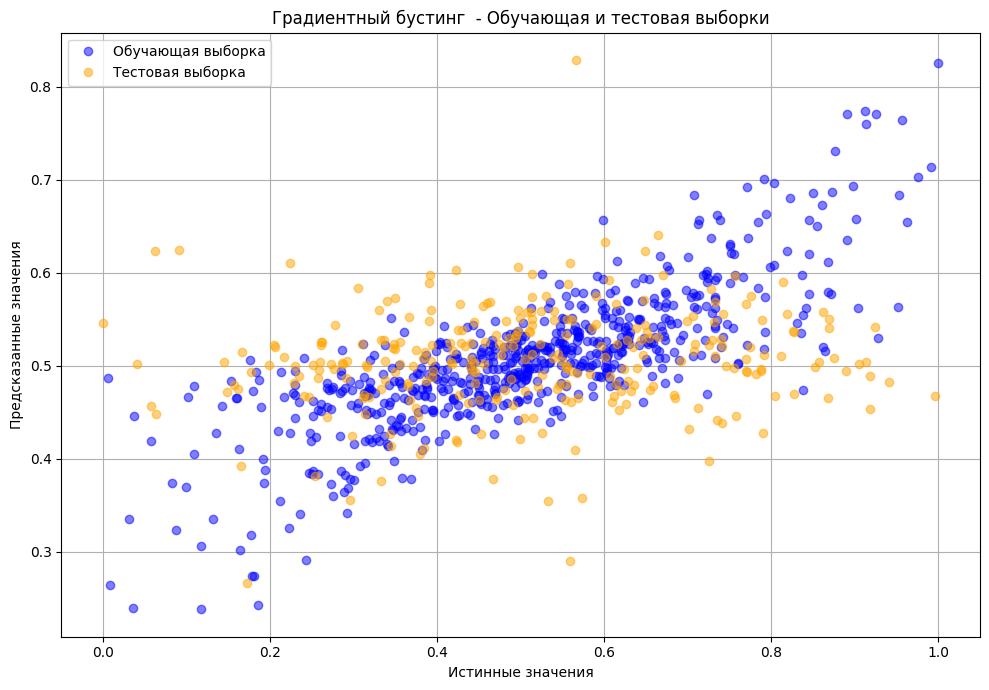

In [80]:
for name, model in best_models.items():
    # Предсказания на обучающей и тестовой выборках
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Построение графиков
    plt.figure(figsize=(10, 7))
    
    # График для обучающей выборки
    plt.title(f"{name} - Обучающая и тестовая выборки")
    plt.plot(y_train, y_train_pred, 'o', label='Обучающая выборка', color='blue', alpha=0.5)
    plt.plot(y_test, y_test_pred, 'o', label='Тестовая выборка', color='orange', alpha=0.5)
        
    plt.xlabel("Истинные значения")
    plt.ylabel("Предсказанные значения")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

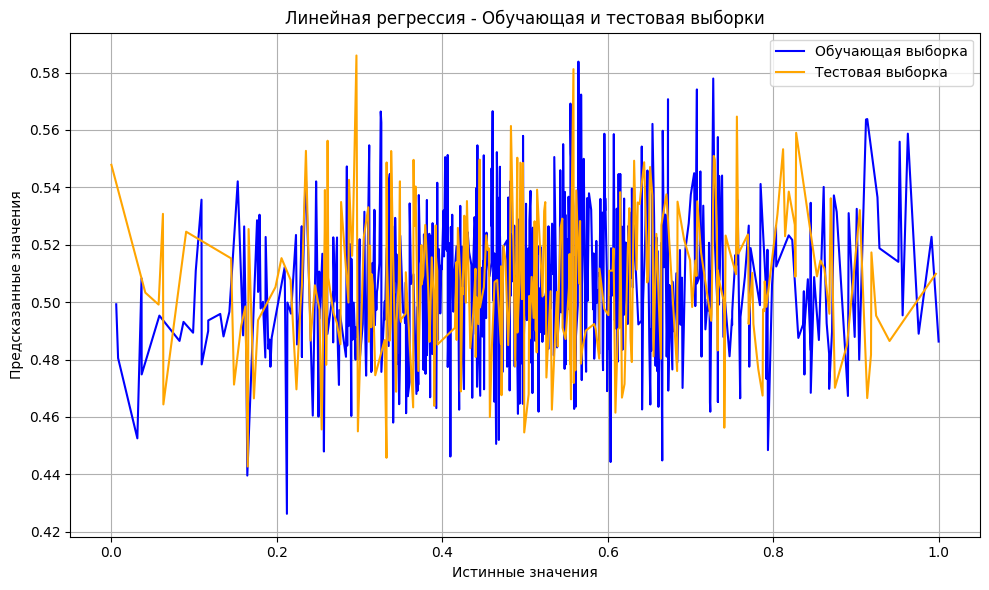

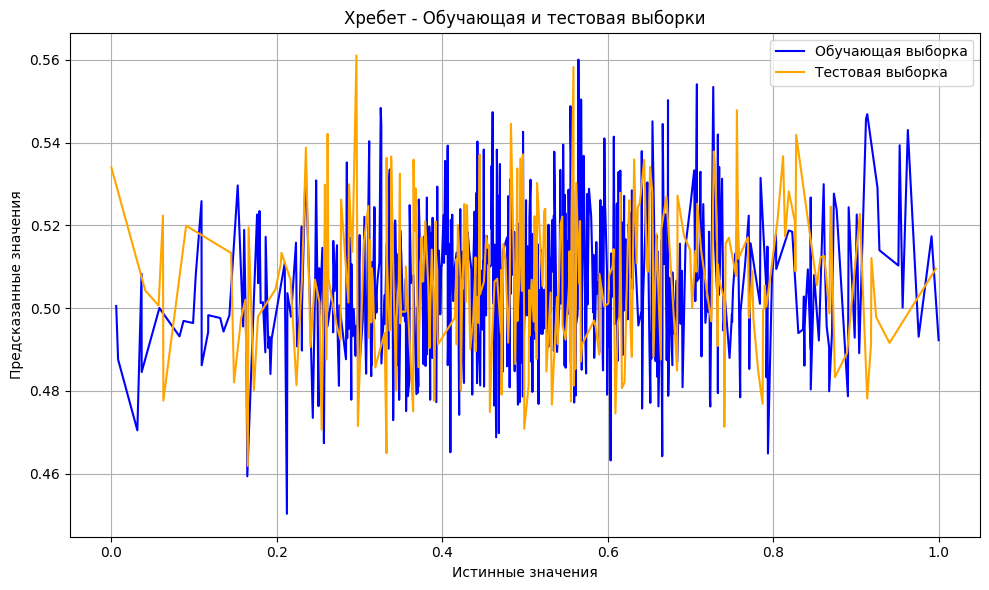

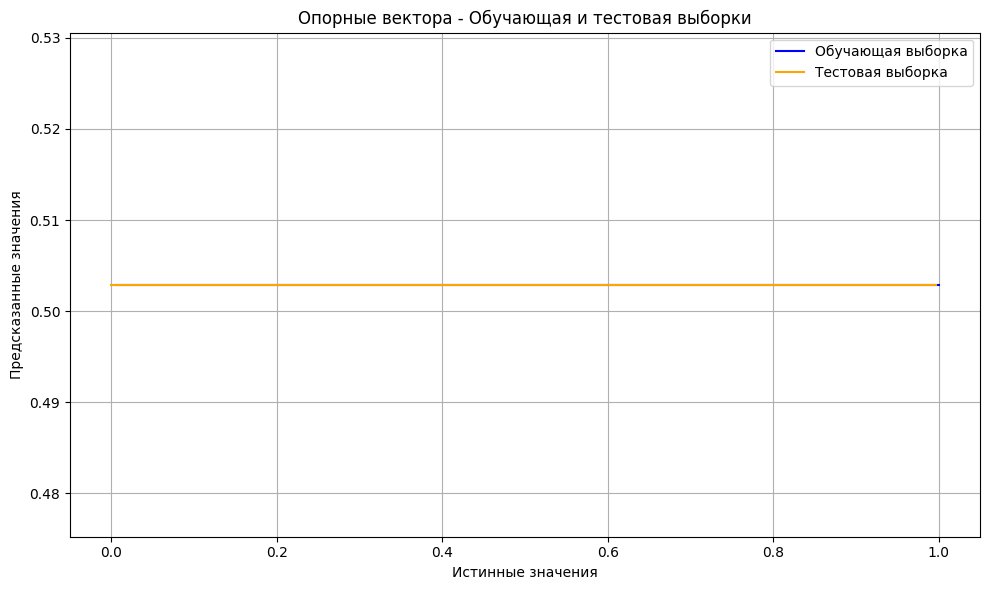

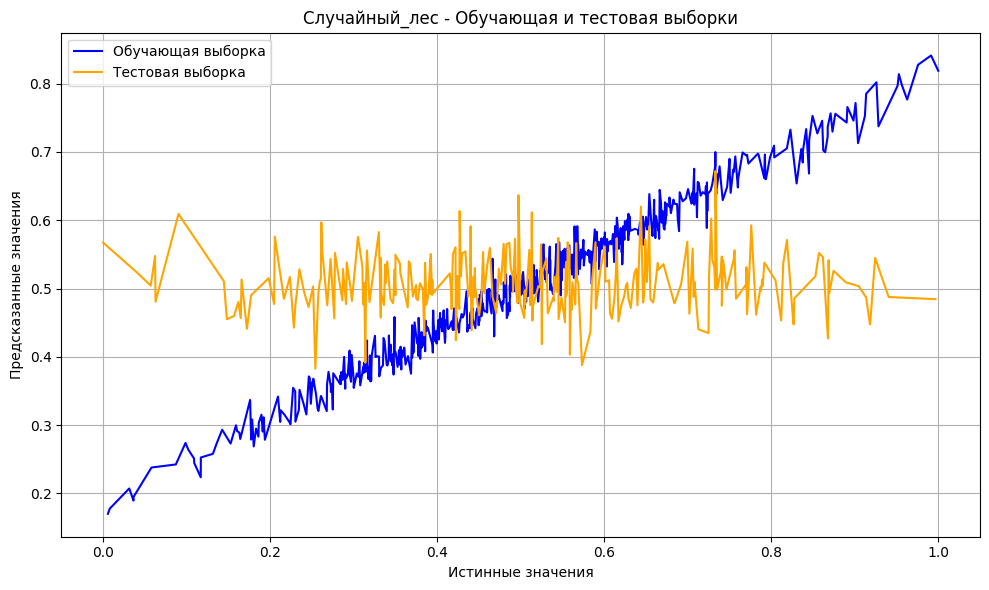

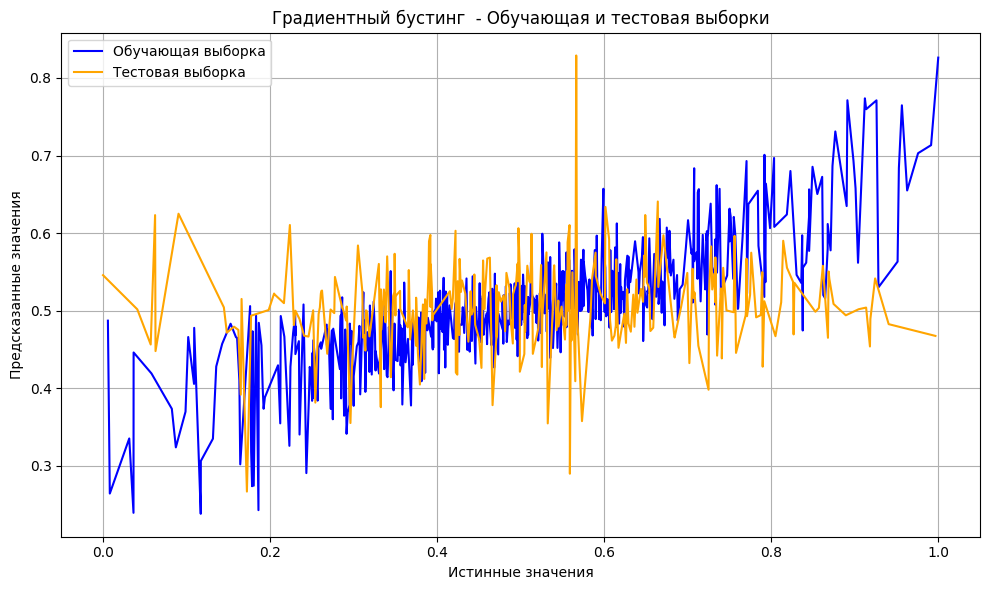

In [81]:
# Предсказания и графики для каждой модели
for name, model in best_models.items():
    # Предсказания на обучающей и тестовой выборках
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Построение графиков
    plt.figure(figsize=(10, 6))
    
    # Сортируем значения для более гладкой линии
    sorted_indices_train = np.argsort(y_train)
    sorted_indices_test = np.argsort(y_test)

    # График для обучающей выборки
    plt.title(f"{name} - Обучающая и тестовая выборки")
    plt.plot(y_train.iloc[sorted_indices_train], y_train_pred[sorted_indices_train], label='Обучающая выборка', color='blue')
    plt.plot(y_test.iloc[sorted_indices_test], y_test_pred[sorted_indices_test], label='Тестовая выборка', color='orange')
     
    plt.xlabel("Истинные значения")
    plt.ylabel("Предсказанные значения")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

*После обучения моделей была проведена оценка точности этих моделей на обучающей и тестовых выборках. Ни одна модель не дала желаемого результата, и не смогла приблизиться к исходным данным.*

# ШАГ 3 - Приступаем к написанию нейронной сети, которая будет рекомендовать соотношение матрица-наполнитель. 

In [82]:

# Выделение признаков и целевой переменной
X = df.drop(columns=['Соотношение матрица-наполнитель'])  # Удаляем целевую переменную
y = df['Соотношение матрица-наполнитель']

# Выведем формы X и y, чтобы убедиться, что разделение выполнено корректно
X.shape, y.shape

((921, 12), (921,))

In [83]:
# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [84]:
model = Sequential()  # Создание модели

# Добавление слоев с регуляризацией и Dropout
model.add(Dense(64, activation='tanh', input_shape=(X_train.shape[1],), kernel_regularizer='l2'))  
model.add(Dropout(0.3))  # Слой Dropout
model.add(Dense(64, activation='tanh', kernel_regularizer='l2'))  
model.add(Dropout(0.3))  # Слой Dropout
model.add(Dense(32, activation='tanh', kernel_regularizer='l2'))  
model.add(Dense(1, activation='sigmoid'))  

c:\Users\USER\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [85]:
model.compile(optimizer='adam', loss='mse', metrics=['mse'])  # Для регрессии

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)# Настройка раннего прекращения

history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=0)

In [86]:
test_loss, test_mse, = model.evaluate(X_test, y_test)
print(f'MSE: {test_mse:.4f}')


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0345 - mse: 0.0345
MSE: 0.0346


In [87]:
# Предсказание и обратное преобразование
predictions = model.predict(X_test)


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


In [88]:
model.save('my_model.keras')# сохраним модель

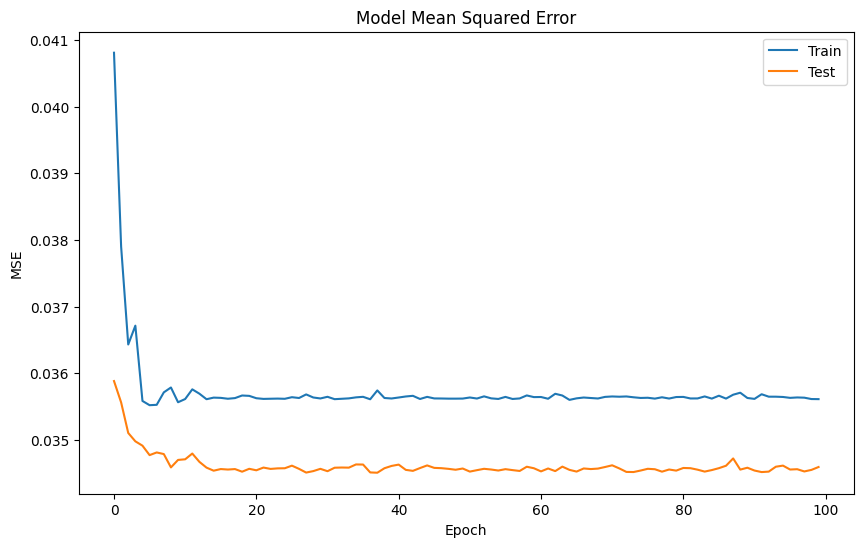

In [89]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
plt.title('Model Mean Squared Error')
plt.ylabel('MSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper right')
plt.show()

# ШАГ 4 - Разрабатываем приложение с графическим интерфейсом, которое будет выдавать прогноз для соотношение матрица-наполнитель.

*Обновленный код с нормализацией*

In [90]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

In [91]:
df_clr = pd.read_excel('df_cleaned_dat.xlsx')

In [92]:
X = df_clr.drop(columns=['Соотношение матрица-наполнитель']) 
y = df_clr['Соотношение матрица-наполнитель']

In [93]:
# Нормализуем данные с помощью MinMaxScaler
scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y, test_size=0.3, random_state=42)

In [95]:
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],), kernel_regularizer='l2'))
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu', kernel_regularizer='l2'))
model.add(Dropout(0.3))
model.add(Dense(64, activation='relu', kernel_regularizer='l2'))
model.add(Dense(1, activation='linear')) 

c:\Users\USER\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [96]:
model.compile(optimizer='adam', loss='mse', metrics=['mse'])

In [97]:
# Ранняя остановка для предотвращения переобучения
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [98]:
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=0, callbacks=[early_stopping])

In [99]:

test_loss, test_mse = model.evaluate(X_test, y_test)
print(f'MSE после нормализации: {test_mse:.4f}')

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.8487 - mse: 0.7890 
MSE после нормализации: 0.7965


In [100]:
model.save('my_model_cleaned.keras')

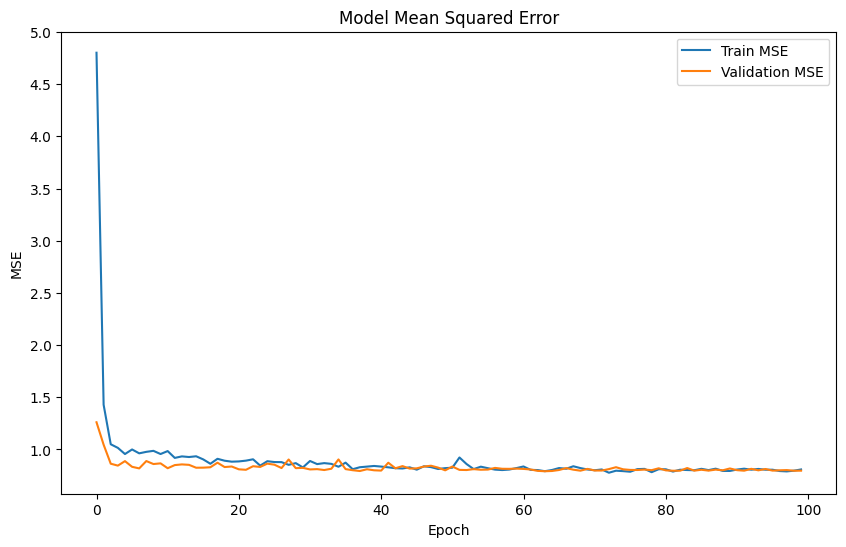

In [101]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['mse'], label='Train MSE')
plt.plot(history.history['val_mse'], label='Validation MSE')
plt.title('Model Mean Squared Error')
plt.ylabel('MSE')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()

*Создание графического пользовательского интерфейса приложения для прогнозов*
*Приложение с графическим интерфейсом пользователя будет:*
*Загрузите сохраненную модель.*
*Разрешить пользователям вводить значения для каждой функции.*
*Проверьте диапазоны входных данных на основе исходного набора данных.*
*Отобразить прогноз или сообщение об ошибке, если введенные данные недействительны.*

In [102]:
import tkinter as tk
from tkinter import messagebox
import numpy as np

In [103]:
# Загрузка модели и данных
model = load_model('my_model_cleaned.keras')
scaler = MinMaxScaler()
scaler.fit(X)  # Fit the scaler on the original dataset

MinMaxScaler()

In [104]:
#Выделение признаков и их диапазонов
columns = X.columns
ranges = {col: (X[col].min(), X[col].max()) for col in columns}

In [105]:
# Создание графического интерфейса GUI
root = tk.Tk()
root.title("Прогнозирование соотношения материалов")

''

In [106]:
# Поля ввода для каждого признака
entries = {}
for col in columns:
    frame = tk.Frame(root)
    frame.pack(pady=5)
    label = tk.Label(frame, text=f"{col} (Диапазон: {ranges[col][0]:.2f} - {ranges[col][1]:.2f})")
    label.pack(side=tk.LEFT)
    entry = tk.Entry(frame)
    entry.pack(side=tk.RIGHT)
    entries[col] = entry

In [107]:
# Функция для предсказания
def predict():
    try:
        # Сбор данных из полей ввода
        input_data = []
        for col in columns:
            value = float(entries[col].get())
            if not (ranges[col][0] <= value <= ranges[col][1]):
                raise ValueError(f"Значение для '{col}' должно быть в диапазоне {ranges[col][0]:.2f} - {ranges[col][1]:.2f}.")
            input_data.append(value)
        
        # Нормализация данных
        input_data = scaler.transform([input_data])
        
        # Предсказание
        prediction = model.predict(input_data)[0][0]
        messagebox.showinfo("Результат предсказания", f"Предсказанное значение 'Соотношение матрица-наполнитель': {prediction:.4f}")
    
    except ValueError as e:
        messagebox.showerror("Ошибка ввода", str(e))
    except Exception as e:
        messagebox.showerror("Ошибка", f"Произошла ошибка: {str(e)}")

In [108]:
# Кнопка для запуска предсказания
predict_button = tk.Button(root, text="Предсказать", command=predict)
predict_button.pack(pady=20)

In [109]:
# Запуск графического интерфейса
root.mainloop()

*В заключении: Результаты (оценки модели) показали себя не самой хорошей стороны. На это могло повлиять множество факторов, начина от набора первоначальных данных, до отсутствия моих компетенций в вопросе композиционных материалов. В данной работе я понял, что от выбора похода к решению задачи и подбора методов будет завесить конечный результат.*